# CS F320 - Assignment 1

# Foundations of Data Science

In this assignment, our task was to work on polynomial regression models. We first worked on simple model having one feature. This was a vanilla simple regression model where there was no regularisation or any complexity.

Our next task was a bit more complex where we were given one more feature, and were expected to do reqularisation with different powers of weights.

Both of the tasks involved building models upto degree 9, so that we cover each aspect and make multiple observations.

Challenge faced: In assignment II-B, we first started with 9 parameters, but further derived total 54 parameters, since parameters can be multiplies to each other too.

Finally we made multiple models, with multiple graphs explaining results for each model. Finally we listed our results and inferences in the end. Do check them out!!

# Assignment 1-A : Regression without regularization

### Loading the Data and Importing the Libraries

In [ ]:
df

,X,Y
0,0.987988,5.098368
1,0.719720,2.516654
2,-0.403403,0.337961
3,0.107107,0.737320
4,0.345345,-0.780955
...,...,...
995,0.671672,3.079356
996,-0.615616,0.027487
997,0.259259,1.068320
998,0.119119,0.245188


In [ ]:
df.describe()

,X,Y
count,1.000000e+03,1000.000000
mean,-4.440892e-18,0.954743
std,5.782171e-01,1.809135
min,-1.000000e+00,-5.091491
25%,-5.000000e-01,-0.106178
50%,5.009014e-17,0.912120
75%,5.000000e-01,1.967479
max,1.000000e+00,6.559203


In [ ]:
df['X'].value_counts().describe() # No NaN values

count    1000.0
mean        1.0
std         0.0
min         1.0
25%         1.0
50%         1.0
75%         1.0
max         1.0
Name: count, dtype: float64

In [ ]:
df['Y'].value_counts().describe() # No NaN values

count    1000.0
mean        1.0
std         0.0
min         1.0
25%         1.0
50%         1.0
75%         1.0
max         1.0
Name: count, dtype: float64

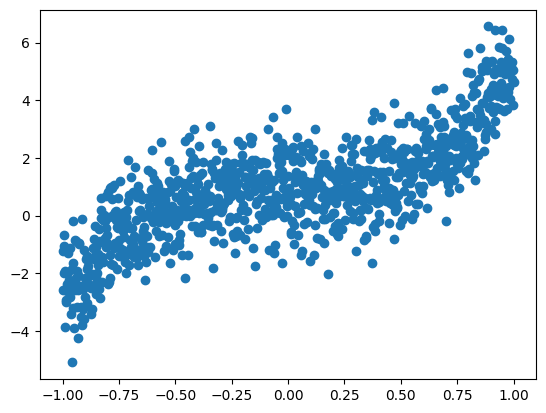

In [ ]:
plt.scatter(df['X'], df['Y'])

#### Making The Polynomial Feature Matrix Phi

In [ ]:
df

,X,X^2,X^3,X^4,X^5,X^6,X^7,X^8,X^9,Y
0,0.987988,0.976120,0.964395,0.952811,0.941366,0.930058,9.188860e-01,9.078484e-01,8.969433e-01,5.098368
1,0.719720,0.517996,0.372812,0.268320,0.193115,0.138989,1.000331e-01,7.199581e-02,5.181680e-02,2.516654
2,-0.403403,0.162734,-0.065648,0.026482,-0.010683,0.004310,-1.738509e-03,7.013204e-04,-2.829150e-04,0.337961
3,0.107107,0.011472,0.001229,0.000132,0.000014,0.000002,1.617067e-07,1.731994e-08,1.855088e-09,0.737320
4,0.345345,0.119263,0.041187,0.014224,0.004912,0.001696,5.858349e-04,2.023154e-04,6.986867e-05,-0.780955
...,...,...,...,...,...,...,...,...,...,...
995,0.671672,0.451143,0.303020,0.203530,0.136705,0.091821,6.167359e-02,4.142440e-02,2.782360e-02,3.079356
996,-0.615616,0.378983,-0.233308,0.143628,-0.088420,0.054432,-3.350946e-02,2.062895e-02,-1.269950e-02,0.027487
997,0.259259,0.067215,0.017426,0.004518,0.001171,0.000304,7.872994e-05,2.041147e-05,5.291862e-06,1.068320
998,0.119119,0.014189,0.001690,0.000201,0.000024,0.000003,3.403066e-07,4.053702e-08,4.828734e-09,0.245188


In [ ]:
X1.describe()

,X,X^2,X^3,X^4,X^5,X^6,X^7,X^8,X^9
count,1.000000e+03,1000.000000,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03
mean,-4.440892e-18,0.334001,-7.993606e-18,2.008013e-01,-1.243450e-17,1.437163e-01,-9.325873e-18,1.120027e-01,-1.021405e-17
std,5.782171e-01,0.298888,3.792890e-01,2.678680e-01,3.031723e-01,2.392761e-01,2.601391e-01,2.174229e-01,2.316001e-01
min,-1.000000e+00,0.000001,-1.000000e+00,1.004010e-12,-1.000000e+00,1.006021e-18,-1.000000e+00,1.008036e-24,-1.000000e+00
25%,-5.000000e-01,0.062877,-1.250011e-01,3.953666e-03,-3.125094e-02,2.486170e-04,-7.812995e-03,1.563443e-05,-1.953337e-03
50%,5.009014e-17,0.250502,1.503401e-22,6.275213e-02,2.508578e-28,1.572002e-02,3.520841e-34,3.938082e-03,4.536171e-40
75%,5.000000e-01,0.562876,1.250011e-01,3.168313e-01,3.125094e-02,1.783387e-01,7.812995e-03,1.003842e-01,1.953337e-03
max,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


### Normalizing the Data

In [ ]:
X1.describe()

,X,X^2,X^3,X^4,X^5,X^6,X^7,X^8,X^9
count,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03
mean,-1.421085e-17,9.681145e-17,-1.243450e-17,-2.664535e-17,4.440892e-18,-3.907985e-17,-1.065814e-17,6.927792e-17,-1.776357e-18
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-1.729454e+00,-1.117473e+00,-2.636512e+00,-7.496280e-01,-3.298455e+00,-6.006296e-01,-3.844097e+00,-5.151374e-01,-4.317788e+00
25%,-8.647271e-01,-9.071080e-01,-3.295670e-01,-7.348683e-01,-1.030798e-01,-5.995905e-01,-3.003391e-02,-5.150655e-01,-8.434097e-03
50%,9.389191e-17,-2.793649e-01,2.107563e-17,-5.153629e-01,4.101463e-17,-5.349313e-01,3.584957e-17,-4.970249e-01,4.410211e-17
75%,8.647271e-01,7.657560e-01,3.295670e-01,4.331610e-01,1.030798e-01,1.446965e-01,3.003391e-02,-5.343708e-02,8.434097e-03
max,1.729454e+00,2.228255e+00,2.636512e+00,2.983554e+00,3.298455e+00,3.578643e+00,3.844097e+00,4.084194e+00,4.317788e+00


<Axes: >

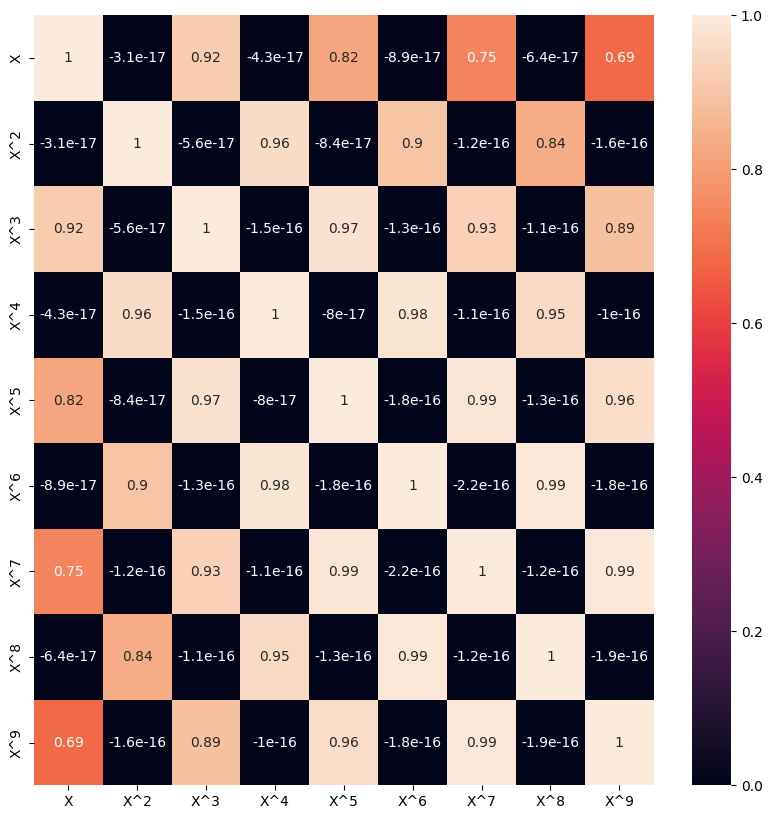

In [ ]:
''' 
Visulaizing the correlation between the features using the COvariance Matrix to see how the features are related to each other
'''

plt.figure(figsize=(10,10))
sns.heatmap(X1.corr(), annot=True)

### Polynomial Regression

#### Batch Gradient Descent

#### Evaluation and Inference

Final Estimate of b and theta :  0.9732380618518013 [1.3534004]
0.6040602750312645
Final Estimate of b and theta :  0.9792973212562031 [1.34848701 0.10060235]
0.6049575797031088
Final Estimate of b and theta :  0.9732464357787649 [0.51990333 0.09640534 0.95264021]
0.7281196098354531
Final Estimate of b and theta :  0.9769838755688697 [ 0.27484811  0.40006831  1.19668548 -0.30309591]
0.7411435926997689
Final Estimate of b and theta :  0.9801106159310277 [ 0.49682933  0.34449672  0.31130474 -0.24759584  0.7101689 ]
0.7458617659054654
Final Estimate of b and theta :  0.9782663242068145 [ 0.33598189  0.10304175  0.57782013  0.20224843  0.59140786 -0.20996987]
0.7522422694470051
Final Estimate of b and theta :  0.9753396209270102 [ 0.57668281  0.30499264  0.16308959 -0.21503556  0.36732969  0.01552588
  0.43087369]
0.744758331494678
Final Estimate of b and theta :  0.9743760280090729 [ 0.45700472  0.25170552  0.20465227 -0.17297305  0.59967929 -0.04452359
  0.26061266  0.0767245 ]
0.7493471

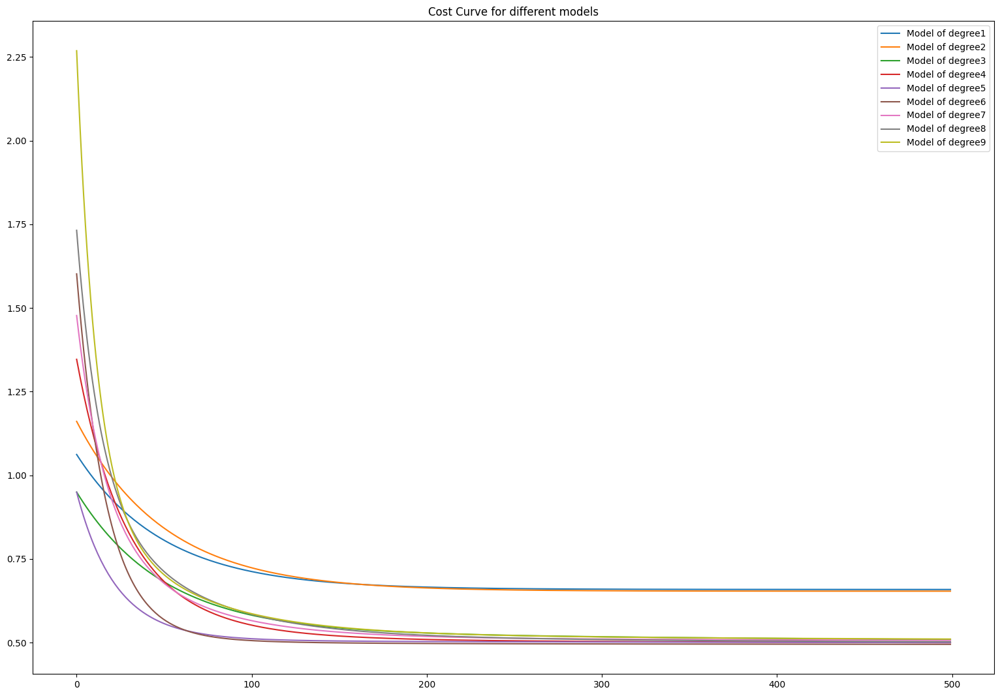

In [ ]:
best_b = None
best_theta = None
best_r2_score = 0
train_errors = []
test_errors = []
r2_scores = []
from sklearn.metrics import r2_score
plt.figure(figsize=(19,13))

for i in range(1 , 10):
    
    Xi_train = X_train[:,:i]
    Xi_test = X_test[:,:i]
    
    b,theta,cost_curve=run_gradient_descent(Xi_train , Y_train , alpha=0.01 , num_iterations=500)
    y_train_pred = predict_Y(b , theta , Xi_train)
    y_test_pred = predict_Y(b , theta , Xi_test)
    train_errors.append(get_cost(Y_train , y_train_pred))
    test_errors.append(get_cost(Y_test , y_test_pred))
    r2 = r2_score(Y_test , predict_Y(b , theta , Xi_test))
    if r2 > best_r2_score:
        best_r2_score = r2
        best_b = b
        best_theta = theta
    r2_scores.append(r2_score(Y_test , predict_Y(b , theta , Xi_test)))
    plt.plot(cost_curve , label = "Model of degree" + str(i))
    print(r2_score(Y_test , predict_Y(b , theta , Xi_test)))
plt.title("Cost Curve for different models")
plt.legend()
print('\n')
print(f'Minimum Cost Function Value: {min(cost_curve)}')

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

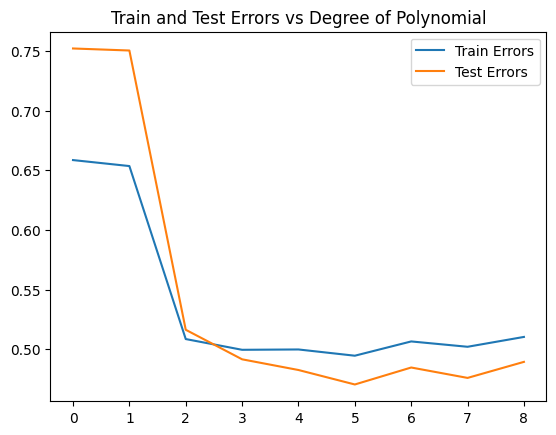

In [ ]:
plt.plot(train_errors , label = "Train Errors")
plt.plot(test_errors , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

Text(0.5, 1.0, 'The best polynomial fitted curve on the data points')

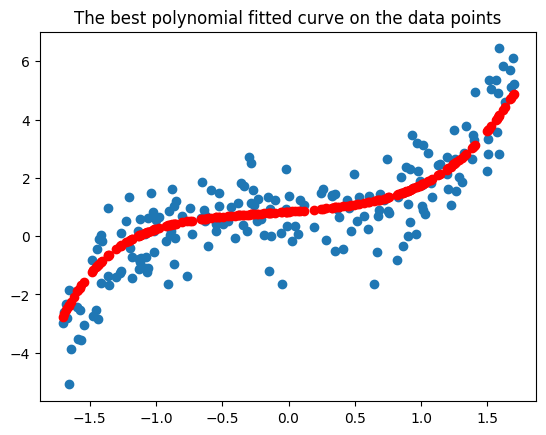

In [ ]:
plt.scatter(X_test[:,0] , Y_test)
plt.scatter(X_test[:,0] , predict_Y(best_b , best_theta , Xi_test[:,:degree]) , color = 'red')
plt.title("The best polynomial fitted curve on the data points")

#### Comparing the Results of all the Models
From sklearn.metrics , r2_score has been used to validate and observe the performance of all the models of all the degrees

<li>Final Estimate of b and theta :  0.9732380618518013 [1.3534004]
0.6040602750312645
<li>Final Estimate of b and theta : 0.9792973212562031 [1.34848701 0.10060235]
0.6049575797031088
<li>Final Estimate of b and theta :  0.9732464357787649 [0.51990333 0.09640534 0.95264021] 0.7281196098354531
<li>Final Estimate of b and theta : 0.9769838755688697 [ 0.27484811  0.40006831  1.19668548 -0.30309591]
0.7411435926997689
<li>Final Estimate of b and theta : 0.9801106159310277 [ 0.49682933  0.34449672  0.31130474 -0.24759584  0.7101689 ]
0.7458617659054654
<li>Final Estimate of b and theta :  0.9782663242068145 [ 0.33598189  0.10304175  0.57782013  0.20224843  0.59140786 -0.20996987]
0.7522422694470051
<li>Final Estimate of b and theta : 0.9753396209270102 [ 0.57668281  0.30499264  0.16308959 -0.21503556  0.36732969  0.01552588
  0.43087369]
<li>Final Estimate of b and theta : 0.9743760280090729 [ 0.45700472  0.25170552  0.20465227 -0.17297305  0.59967929 -0.04452359
  0.26061266  0.0767245 ]
<li>Final Estimate of b and theta :   0.9725139996423853 [ 0.70606047  0.04427592 -0.08581005 -0.09144557  0.40650418  0.22832388
  0.4975032  -0.08293493  0.02188101]
0.7422708442618553

<br>
Minimum Cost Function Value: 0.5104047476828873
 


# Final Conclusion

We are choosing the degree of the polynomial to be 6 because of its highest R2 score. The R2 score is defined below.

(R2 score: The R-squared (R2) score, also known as the coefficient of determination, is a statistical measure that assesses a regression model's goodness of fit. It quantifies the fraction of the variance in the dependent variable explained by the model's independent variables. In other words, it assesses how effectively the model's independent variables account for the variability in the dependent variable.

Text(0.5, 1.0, 'R2 Score vs Degree of Polynomial')

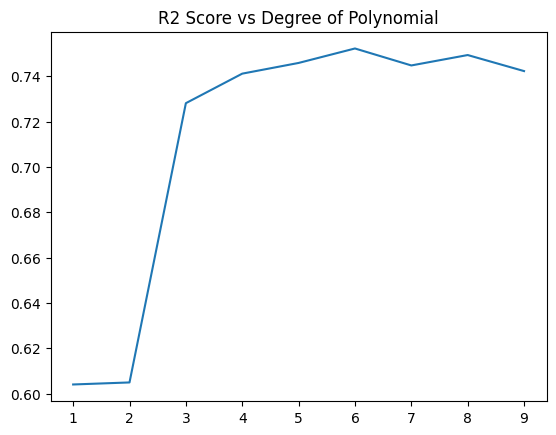

In [ ]:
plt.plot( np.arange(1,10) , r2_scores)
plt.title("R2 Score vs Degree of Polynomial")

# Inference

R2 score is pretty low in the beginning because of underfit in the data, rendering the model useless.

As we increase the degree of the model, our R2 score increases and peaks at a reasonable degree = 6.

# Assignment 1-B Polynomial Regression and Regularization

##### Multivariate Polynomial Regression is a powerful technique used in machine learning and statistics to model relationships between multiple independent variables and a dependent variable.

### Loading the Dataset and Preprocessing

In [ ]:
df

,Height,Width,Weight
0,11.5200,4.0200,242.0
1,12.4800,4.3056,290.0
2,12.3778,4.6961,340.0
3,12.7300,4.4555,363.0
4,12.4440,5.1340,430.0
...,...,...,...
154,2.0904,1.3936,12.2
155,2.4300,1.2690,13.4
156,2.2770,1.2558,12.2
157,2.8728,2.0672,19.7


In [ ]:
df.head()

,Height,Width,Weight
0,11.5200,4.0200,242.0
1,12.4800,4.3056,290.0
2,12.3778,4.6961,340.0
3,12.7300,4.4555,363.0
4,12.4440,5.1340,430.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159 entries, 0 to 158
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Height  159 non-null    float64
 1   Width   159 non-null    float64
 2   Weight  159 non-null    float64
dtypes: float64(3)
memory usage: 3.9 KB


In [ ]:
df.describe()

,Height,Width,Weight
count,159.000000,159.000000,159.000000
mean,8.970994,4.417486,398.326415
std,4.286208,1.685804,357.978317
min,1.728400,1.047600,0.000000
25%,5.944800,3.385650,120.000000
50%,7.786000,4.248500,273.000000
75%,12.365900,5.584500,650.000000
max,18.957000,8.142000,1650.000000


In [ ]:
df.isnull().describe()


,Height,Width,Weight
count,159,159,159
unique,1,1,1
top,False,False,False
freq,159,159,159


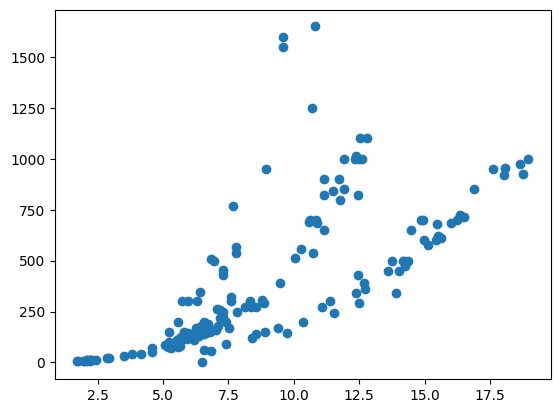

In [ ]:
plt.figure()
plt.scatter(df['Height'] , df['Weight'])
plt.show()

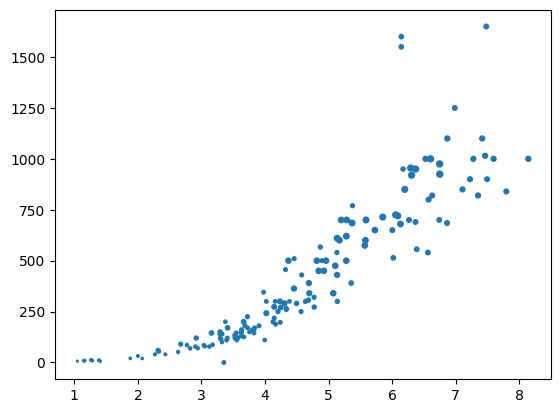

In [ ]:
plt.figure()
plt.scatter(df['Width'] , df['Weight'] , s = df['Height'])
plt.show()

Below are the cells containing the Covariance Matrix and the HeatMap of the dataset.
Both of these are used to observe and understand the relationship between the features.

In [ ]:
df.corr()

,Height,Width,Weight
Height,1.000000,0.792881,0.724345
Width,0.792881,1.000000,0.886507
Weight,0.724345,0.886507,1.000000


<Axes: >

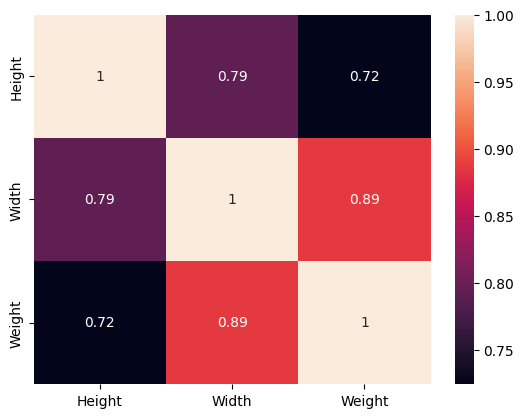

In [ ]:
sns.heatmap(df.corr() , annot=True)

### Normalizing the data

In [ ]:
df1.describe()

,0,1,2,3,4,5,6,7,8,9,...,44,45,46,47,48,49,50,51,52,53
count,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,...,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,1.590000e+02,159.000000,1.590000e+02,1.590000e+02,1.590000e+02
mean,4.468822e-17,-2.793014e-16,-5.446377e-17,-6.703233e-17,-1.787529e-16,2.066830e-16,-1.005485e-16,-2.234411e-17,-1.340647e-16,5.586028e-17,...,-1.228926e-16,1.117206e-17,6.144631e-17,-5.586028e-17,-6.703233e-17,-4.468822e-17,0.000000,4.468822e-17,-2.234411e-17,6.703233e-17
std,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,...,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160e+00,1.003160,1.003160e+00,1.003160e+00,1.003160e+00
min,-1.695083e+00,-2.005294e+00,-1.393413e+00,-1.355295e+00,-1.110502e+00,-1.031149e+00,-1.070673e+00,-9.595005e-01,-8.088756e-01,-8.166256e-01,...,-4.274640e-01,-4.755387e-01,-5.198770e-01,-5.262690e-01,-4.866329e-01,-4.350682e-01,-0.394576,-3.677704e-01,-3.510241e-01,-3.407206e-01
25%,-7.082613e-01,-6.140072e-01,-7.134430e-01,-7.605682e-01,-7.352600e-01,-7.141543e-01,-7.656299e-01,-7.398114e-01,-6.750683e-01,-6.710143e-01,...,-4.247660e-01,-4.722742e-01,-5.163127e-01,-5.232729e-01,-4.843936e-01,-4.336121e-01,-0.393688,-3.672182e-01,-3.506775e-01,-3.405332e-01
50%,-2.773402e-01,-1.005570e-01,-2.813285e-01,-3.759743e-01,-4.420437e-01,-3.953484e-01,-4.761583e-01,-4.971190e-01,-5.040592e-01,-4.536001e-01,...,-4.066548e-01,-4.503000e-01,-4.933995e-01,-5.049352e-01,-4.681075e-01,-4.236692e-01,-0.386625,-3.623414e-01,-3.473159e-01,-3.385949e-01
75%,7.945562e-01,6.944472e-01,5.804641e-01,8.360521e-01,6.284033e-01,4.251548e-01,7.163901e-01,6.714382e-01,4.224224e-01,2.698099e-01,...,-1.836802e-01,-4.920976e-02,-2.589524e-02,3.738973e-02,5.705073e-02,-1.701723e-02,-0.054677,-1.318307e-01,-1.838824e-01,-2.040313e-01
max,2.337161e+00,2.216321e+00,2.883415e+00,2.531799e+00,3.022888e+00,3.502438e+00,2.630067e+00,3.302119e+00,3.635920e+00,4.097073e+00,...,6.828848e+00,6.449374e+00,5.591577e+00,4.443445e+00,5.262693e+00,5.571437e+00,5.630442,5.788703e+00,5.925552e+00,6.050959e+00


## Polynomaial Regression

By fitting a polynomial equation to the data, polynomial regression is a sort of regression analysis used to represent the relationship between a dependent variable and one or more independent variables.

The general equation for polynomial regression with one independent variable (simple polynomial regression) is:

y = β₀ + β₁x + β₂x² + β₃x³ + ... + βₘxᵐ + ε<br>
The degree of the polynomial, denoted by m, determines the complexity of the model. A higher degree allows the model to capture more complex patterns in the data but may also lead to overfitting if not chosen carefully.

### Batch Gradient Descent

In batch gradient descent, the cost function's gradient is calculated for each iteration using the whole training dataset. After analyzing the complete dataset, the coefficients are updated.
 Gradient is defined as (Loss) = -2/n * (yi - i) * xi + q * Wi (q-1)/2. 

 <li>Batch Gradient Descent is an optimization algorithm used to minimize a cost function by iteratively adjusting model parameters
 <li>The gradients of the cost function J(θ) with respect to each parameter θₖ for all k. This is done by taking the partial derivatives of J(θ) with respect to each θₖ: ∂J(θ) / ∂θₖ for all k = 0, 1, 2, ..., n
<li>The gradients represent the direction of steepest ascent in the cost function.
<li>The model parameters θ are adjusted in the opposite direction of the gradients to minimize the cost function. This is done using the learning rate (α): θₖ := θₖ - α * ∂J(θ) / ∂θₖ for all k.

### Evaluation of Batch Gradient Descent

####  Q = 0.5

Final Estimate of b and theta :  [] 390.14575263216847
-0.010684147762654916


Final Estimate of b and theta :  [ 33.48615726 289.23201583] 388.6091207268409
0.7526255414023484


Final Estimate of b and theta :  [-58.71296668  54.45543725 203.50889212 101.3212227   32.85581699] 391.1226721454098
0.7676683142964156


Final Estimate of b and theta :  [-2.10247000e+01  5.08151963e+01  9.58943527e+01  3.44443834e+01
 -1.70144535e-02  1.00932419e+02  5.13719659e+01  1.87911149e+01
  9.35451173e+00] 392.2343686419375
0.7446746663041203


Final Estimate of b and theta :  [-8.54627088e+00  5.95991954e+01  8.29067051e+01  3.09616213e+01
  1.11873027e+01  6.99763936e+01  3.21664163e+01  1.27750764e+01
  7.66397269e+00  3.95789004e+01  1.15047049e+01 -3.00901782e+00
 -2.20506735e+00 -3.92606733e-03] 392.4533559640527
0.7378304955047101


Final Estimate of b and theta :  [-1.49378133e+01  6.18289720e+01  8.54384707e+01  3.15734436e+01
  8.80979013e+00  7.21162117e+01  3.58687002e+01  1.51207121e+0

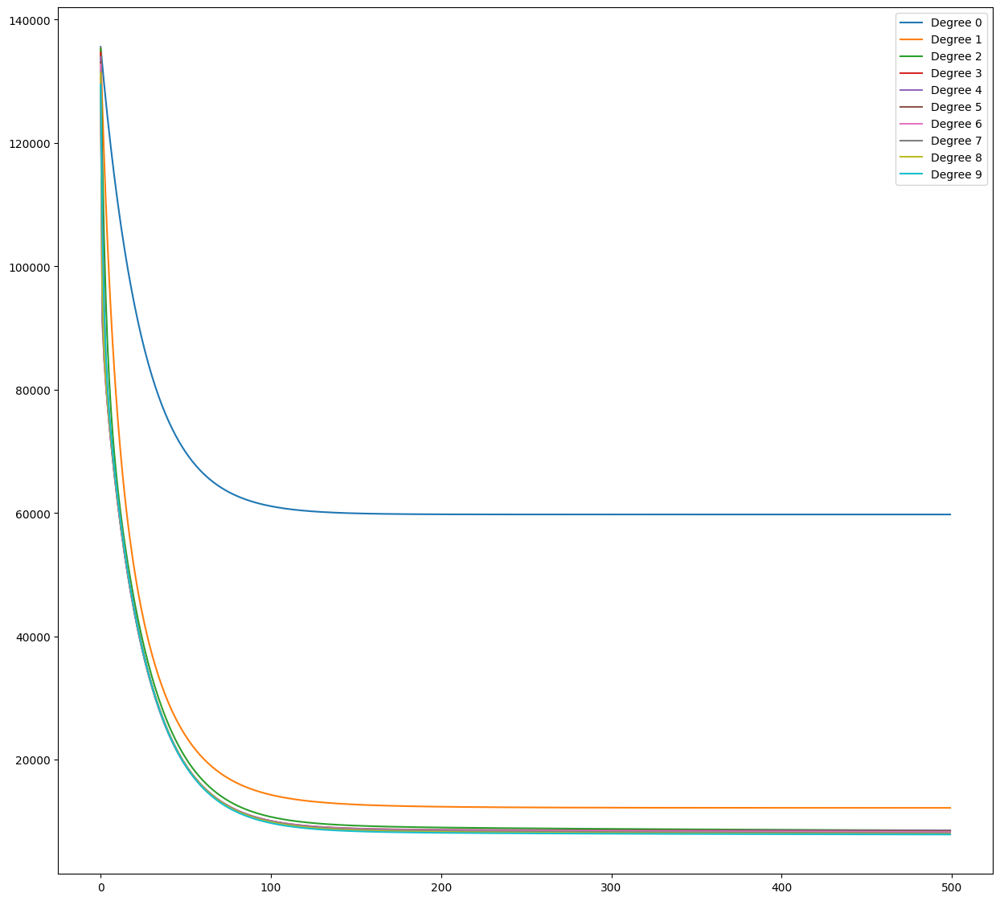



Minimum Cost Function Value: 7882.053401162322


In [ ]:
plt.figure(figsize=(15,14))
Q=0.5
_lambda=.75 #lambda
costs = []
train_errors = []
test_errors = []
all_b = []
all_theta = []
for i in range(1,11):

    num = i*(i+1)//2 -1
    
    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]

    b ,theta , cost_curve = run_gradient_descent(Xi_train , Y_train , alpha=0.02 , num_iterations=500)
    y_train_pred = predict_Y(b , theta , Xi_train)
    y_test_pred = predict_Y(b , theta , Xi_test)
    train_errors.append(get_error_value(Y_train , y_train_pred))
    test_errors.append(get_error_value(Y_test , y_test_pred))
    costs.append(cost_curve[-1])
    all_b.append(b)
    all_theta.append(theta)
    print(r2_score(Y_test , predict_Y(b, theta, Xi_test)))
    print('\n')
    plt.plot(cost_curve , label=f'Degree {i-1}')
plt.legend()
plt.show()
print('\n')
print(f'Minimum Cost Function Value: {min(cost_curve)}')

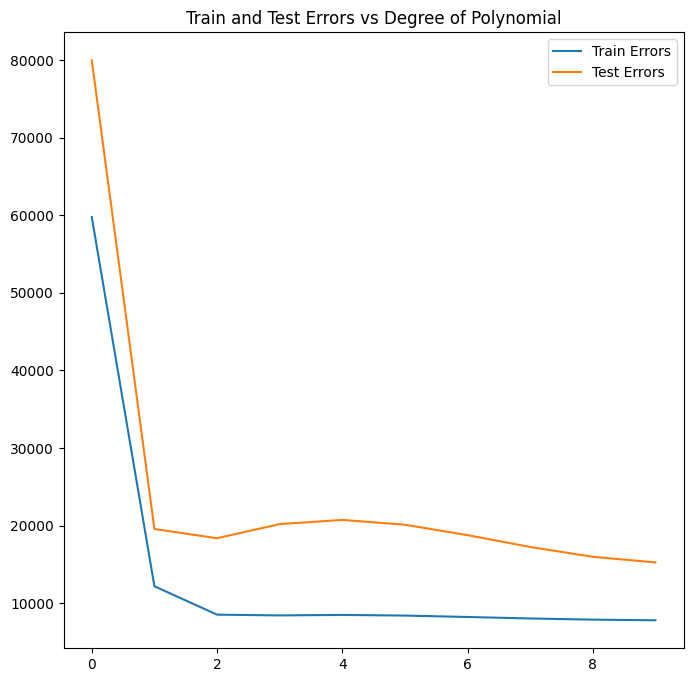

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(train_errors , label = "Train Errors")
plt.plot(test_errors , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")
plt.show()

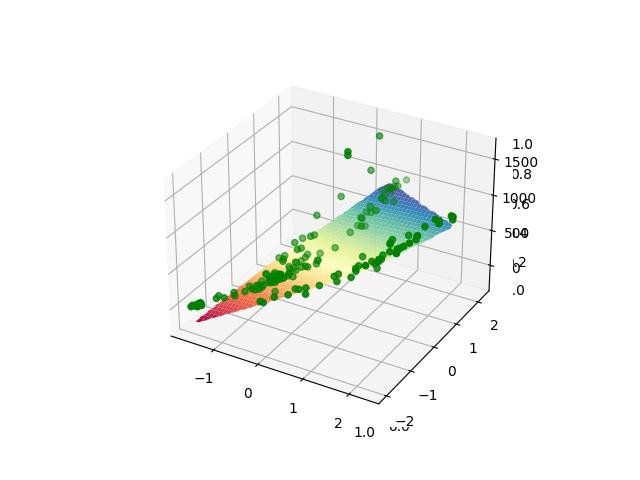

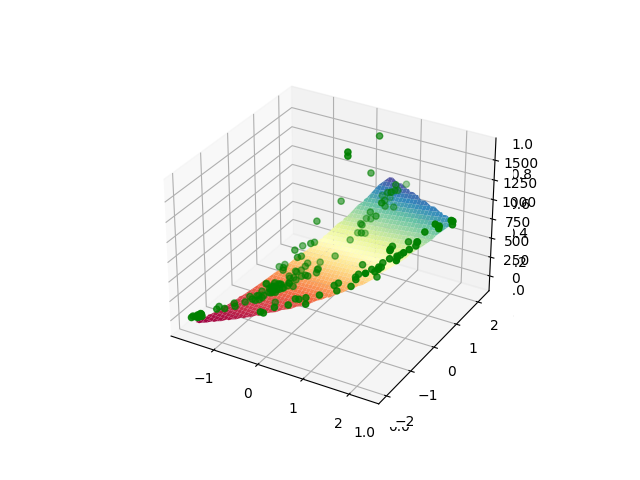

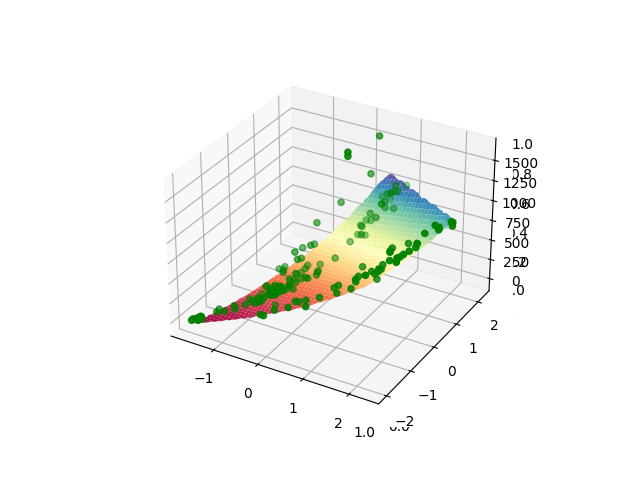

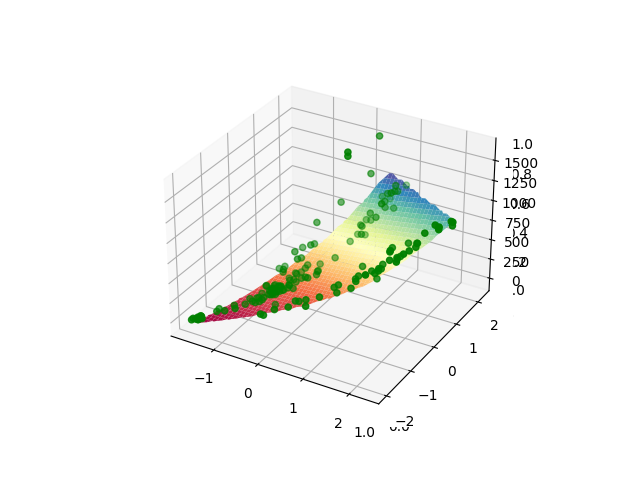

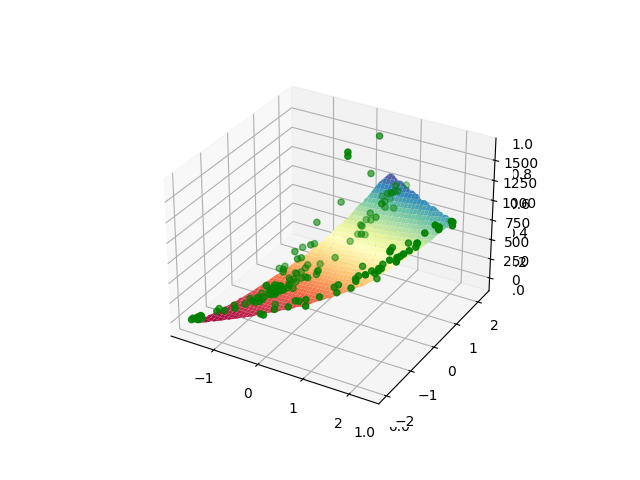

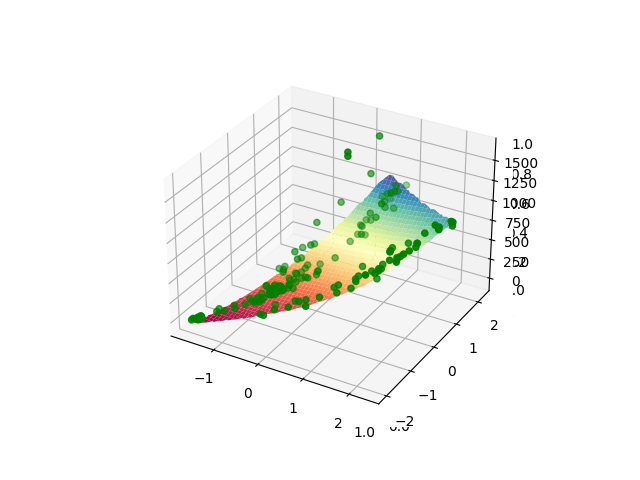

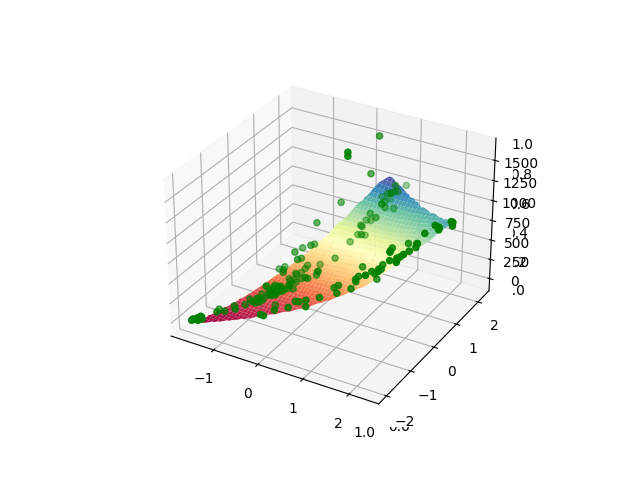

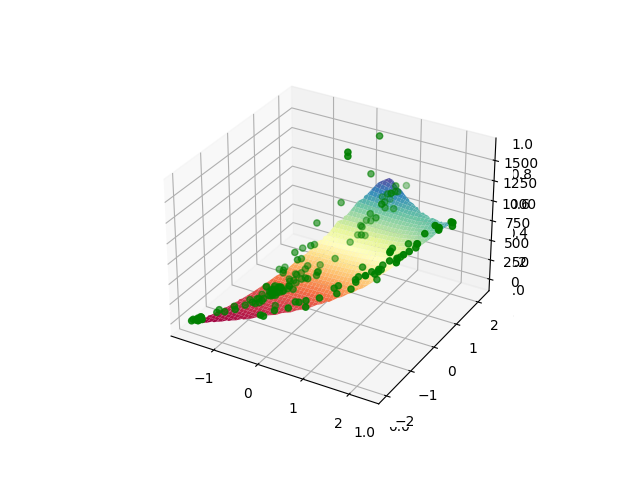

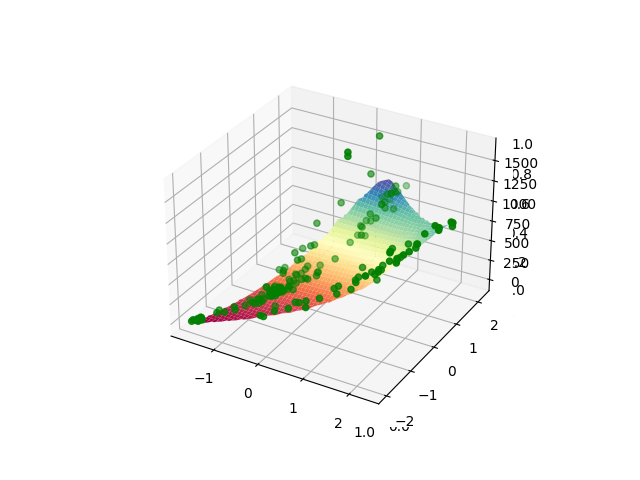

In [ ]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y

        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

#### Q = 1

Final Estimate of b and theta :  [] 387.54234340226685
-0.012079897920660887


Final Estimate of b and theta :  [ 49.60386953 272.28434693] 385.7108775682509
0.7456462782298021


Final Estimate of b and theta :  [-28.71539444  85.9403008  174.44056724  85.19407287  16.0803933 ] 387.99675192745644
0.7680038884626604


Final Estimate of b and theta :  [-12.87205548  59.37264379  88.77335656  35.14141028  -0.57274387
  94.39513777  54.71323597  19.37608927   0.96314585] 389.375447732811
0.7457574915025087


Final Estimate of b and theta :  [ 2.37954204 62.74335935 70.7083711  30.01336812  5.25266739 61.52858175
 32.16117075 10.25482961  2.0409562  43.45897701 22.23983197  5.35507736
 -2.08906793 -2.96964959] 389.87313952383454
0.7325349061984333


Final Estimate of b and theta :  [ 3.78205825 64.92272186 70.11937759 30.76022848  6.4671573  56.66408438
 31.71797725 12.07777922  5.25921505 36.71417412 19.28848416  6.41647013
  0.88408185  2.77329029 13.49830948  1.67614842 -6.72793162 -7.43

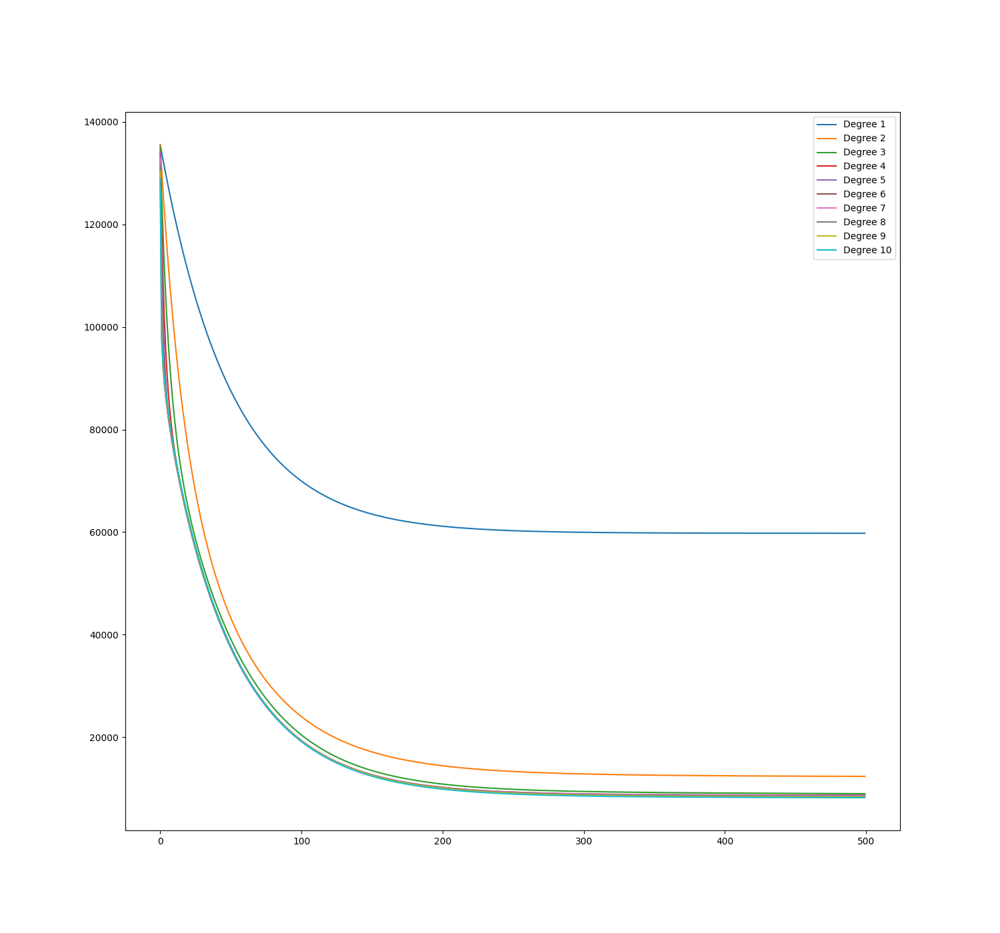



Minimum Cost Function Value: 8182.674180605838


In [ ]:
plt.figure(figsize=(15,14))
Q=1
_lambda=.5 #lambda
costs = []
all_b = []
all_theta = []
train_errors1 = []
test_errors1 = []
for i in range(1,11):

    num = i*(i+1)//2 -1
    
    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]

    b ,theta , cost_curve = run_gradient_descent(Xi_train , Y_train , alpha=0.01 , num_iterations=500)
    y_train_pred = predict_Y(b , theta , Xi_train)
    y_test_pred = predict_Y(b , theta , Xi_test)
    train_errors1.append(get_error_value(Y_train , y_train_pred))
    test_errors1.append(get_error_value(Y_test , y_test_pred))
    costs.append(cost_curve[-1])
    all_b.append(b)
    all_theta.append(theta)
    print(r2_score(Y_test , predict_Y(b, theta, Xi_test)))
    print('\n')
    plt.plot(cost_curve , label=f'Degree {i}')
plt.legend()
plt.show()
print('\n')
print(f'Minimum Cost Function Value: {min(cost_curve)}')  

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

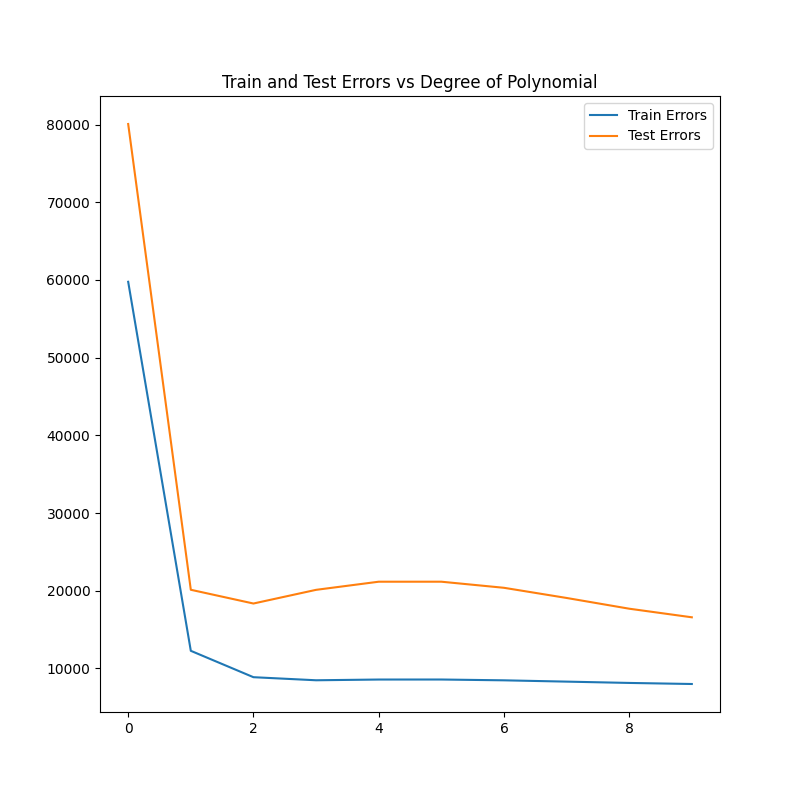

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(train_errors1 , label = "Train Errors")
plt.plot(test_errors1 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

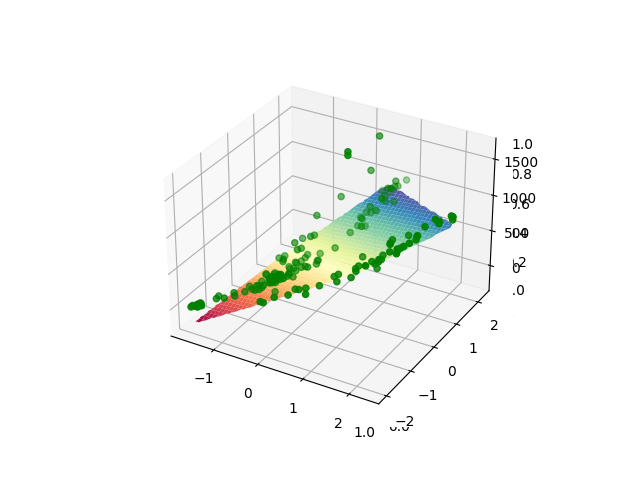

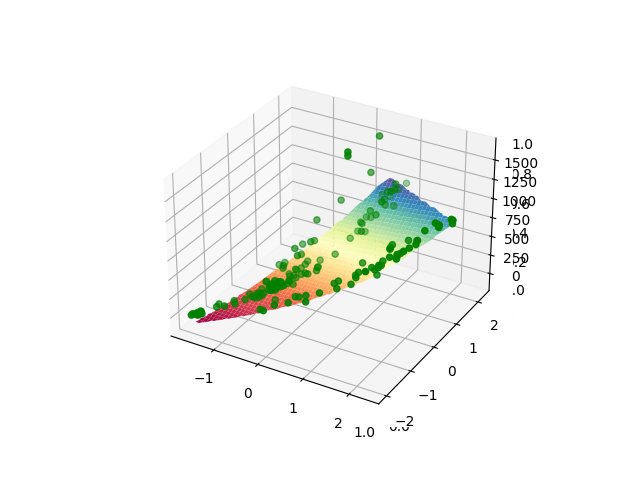

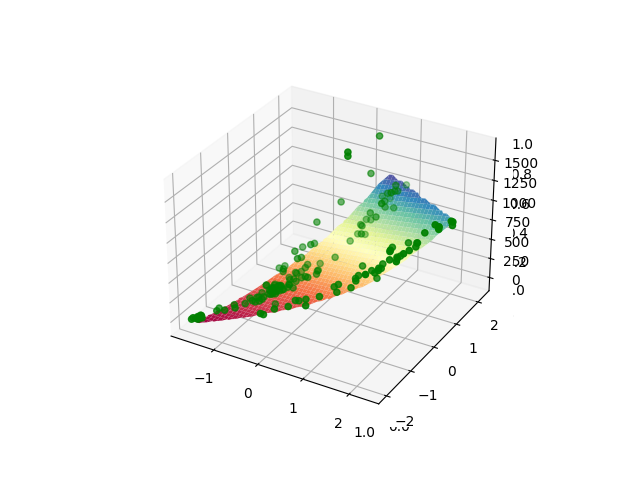

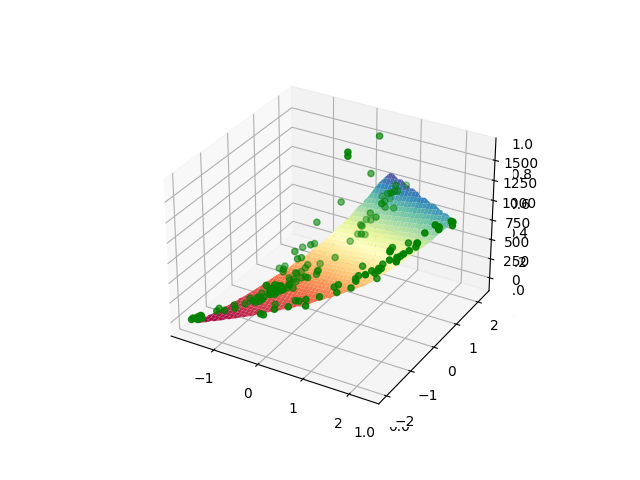

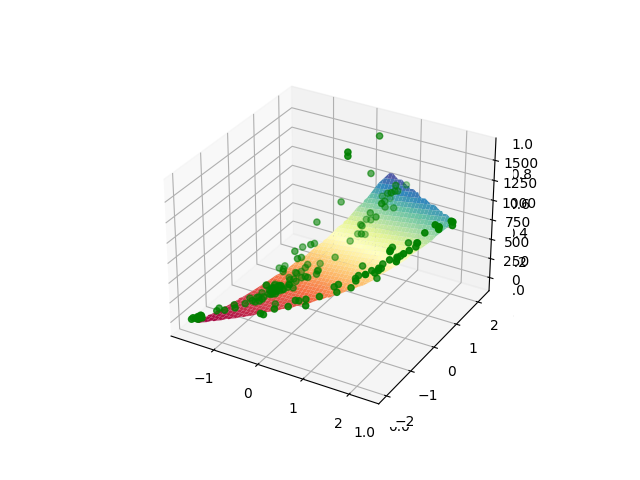

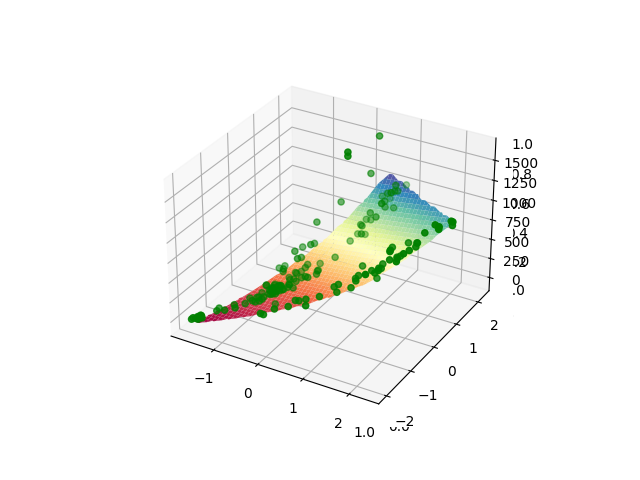

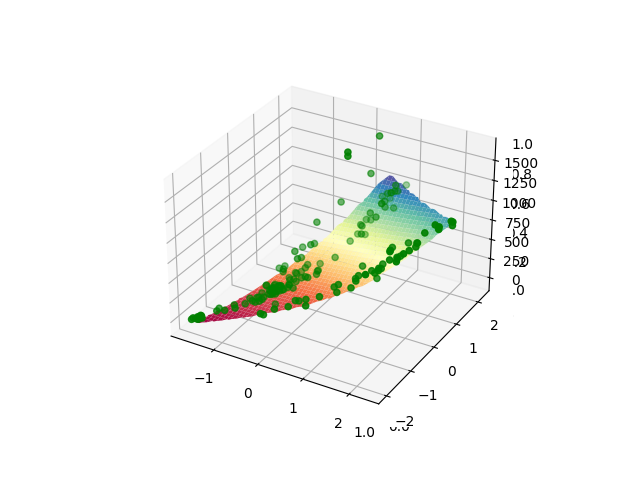

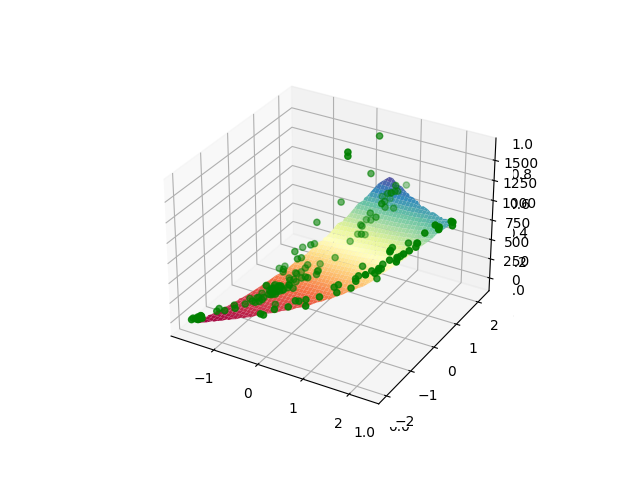

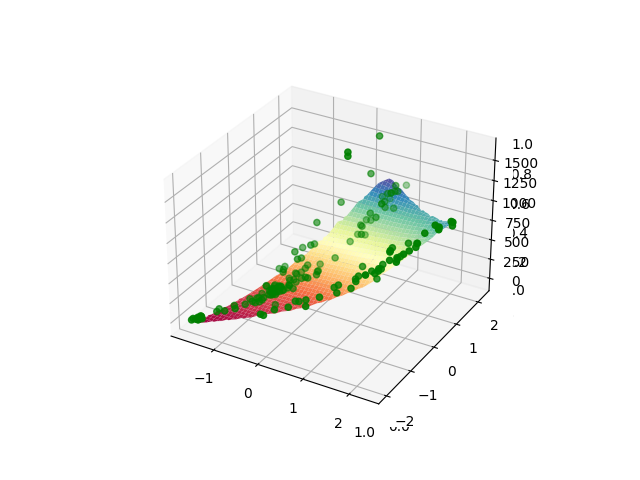

In [ ]:

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

#### Q = 2

C:\Users\agarw\AppData\Local\Temp\ipykernel_6300\4064408270.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15,14))


Final Estimate of b and theta :  [] 387.7760841751274
-0.011951083772312243


Final Estimate of b and theta :  [ 51.09868498 269.94114652] 385.93581767702045
0.7451477613597554


Final Estimate of b and theta :  [-28.38796982  86.29799981 172.85457406  85.20409495  16.5748446 ] 388.2073252609653
0.7681176748132307


Final Estimate of b and theta :  [-12.40104149  59.42393762  88.37364181  34.75653107  -0.44840843
  94.45213828  54.34497814  19.34943189   1.37179669] 389.5993664580001
0.7460061062970247


Final Estimate of b and theta :  [ 3.00615748 61.90394174 70.18926413 30.27652218  5.00619361 61.31880979
 32.19196202 10.63643045  1.93477514 43.71027037 22.70120457  5.45304566
 -1.96894344 -3.45534085] 390.1175583906398
0.7322752592080672


Final Estimate of b and theta :  [ 3.71376915 64.24769049 69.50602105 30.67940146  7.36079187 56.93266631
 31.24115131 12.03384542  5.38413572 36.21607431 19.23848889  6.44695682
  1.87559672  2.19105851 14.25272208  2.12972864 -6.24549826 -7.942

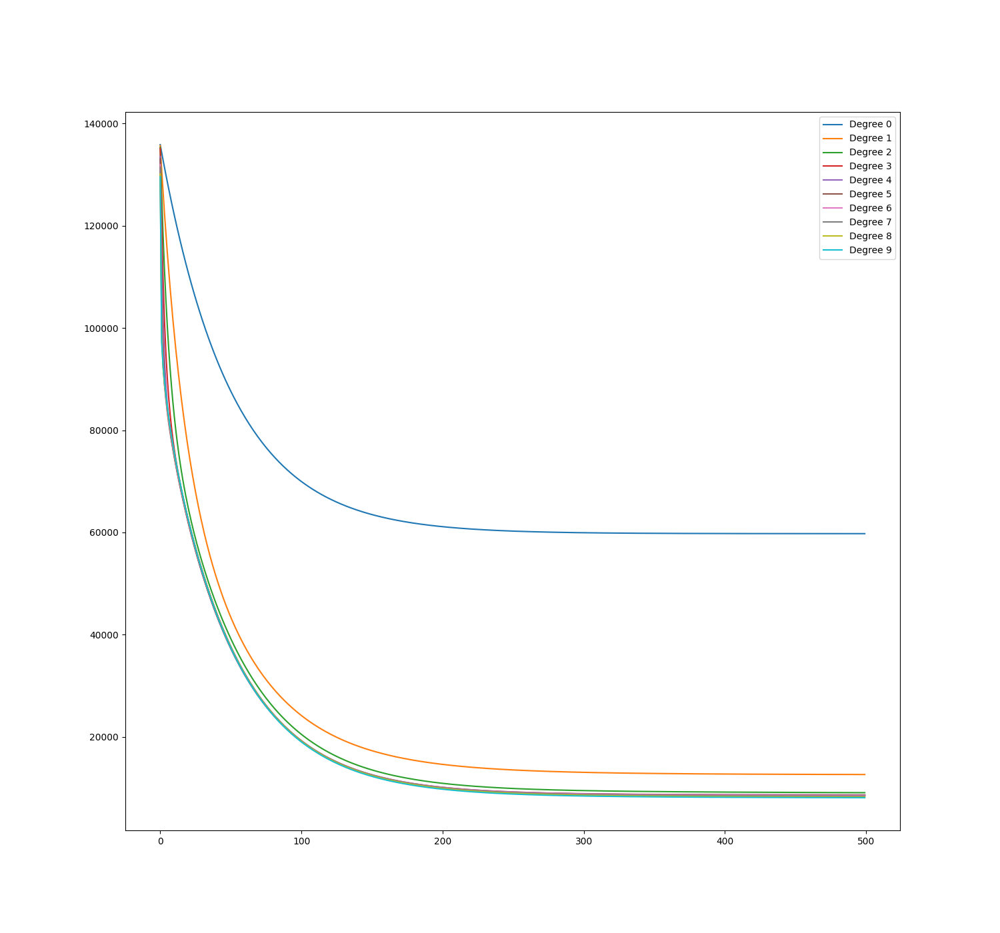

In [ ]:
theta_plot = []
b_plot = 0
all_b = []
all_theta = []
train_errors2 = []
test_errors2 = []
plt.figure(figsize=(15,14))
Q=2
_lambda=.01 #lambda
costs = []
for i in range(1,11):

    num = i*(i+1)//2 -1
    
    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]

    b ,theta , cost_curve = run_gradient_descent(Xi_train , Y_train , alpha=0.01 , num_iterations=500)
    y_train_pred = predict_Y(b , theta , Xi_train)
    y_test_pred = predict_Y(b , theta , Xi_test)
    train_errors2.append(get_error_value(Y_train , y_train_pred))
    test_errors2.append(get_error_value(Y_test , y_test_pred))
    b_plot , theta_plot = b , theta
    all_b.append(b)
    all_theta.append(theta)
    costs.append(cost_curve[-1])
    print(r2_score(Y_test , predict_Y(b, theta, Xi_test)))
    print('\n')
    plt.plot(cost_curve , label=f'Degree {i-1}')
plt.legend()
print('\n')
print(f'Minimum Cost Function Value: {min(cost_curve)}')  

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

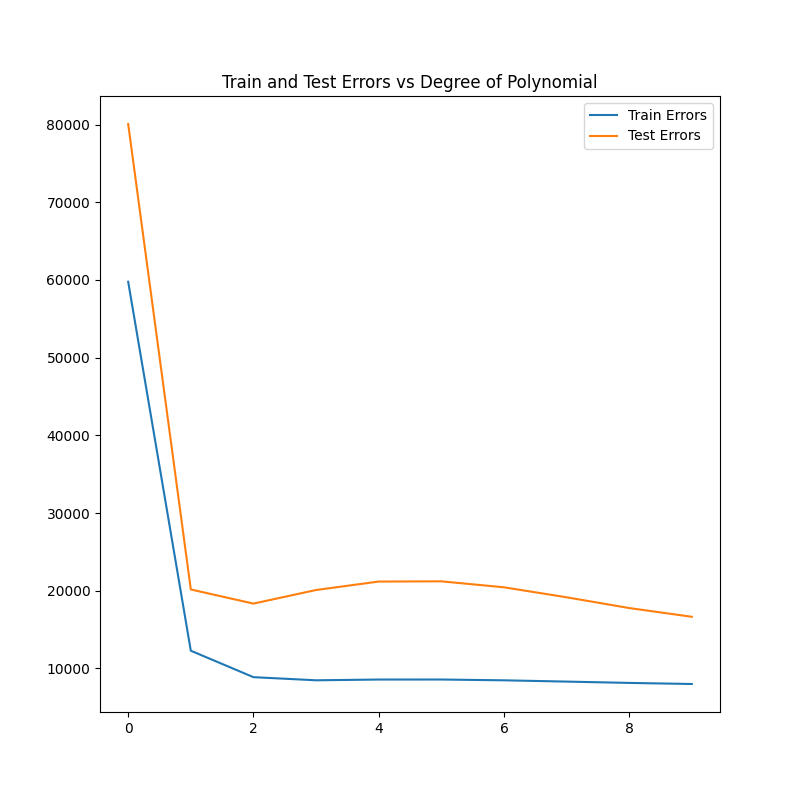

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(train_errors2 , label = "Train Errors")
plt.plot(test_errors2 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

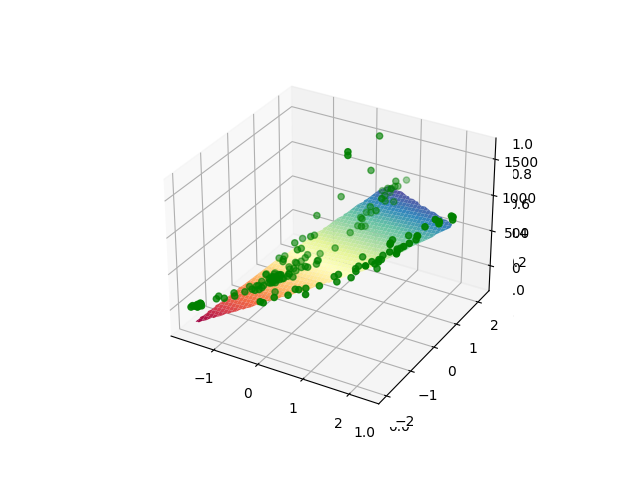

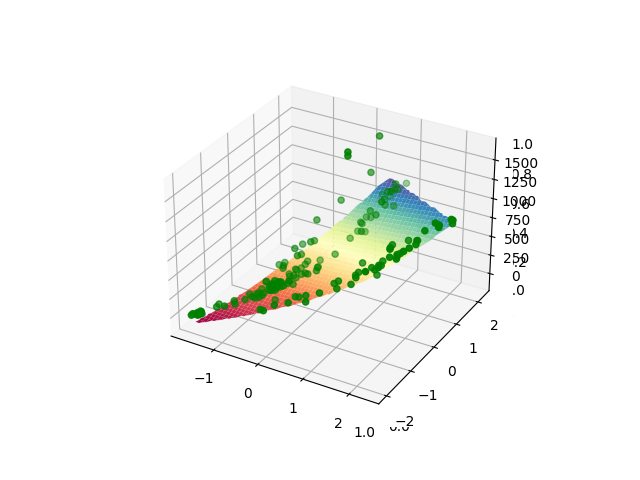

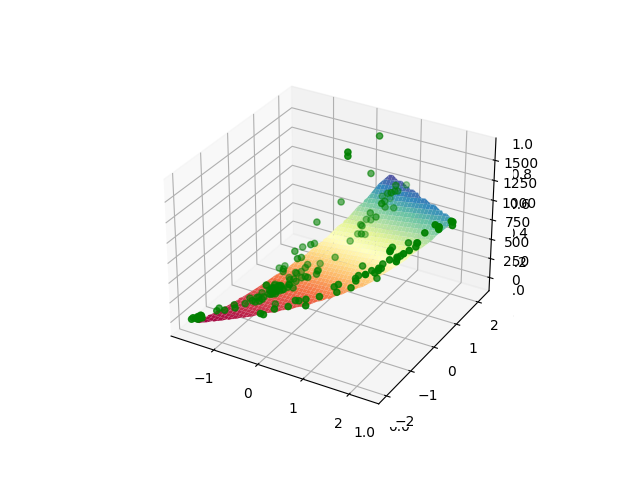

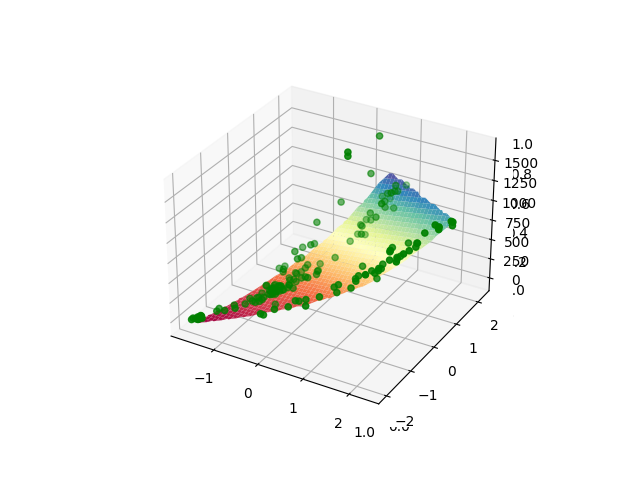

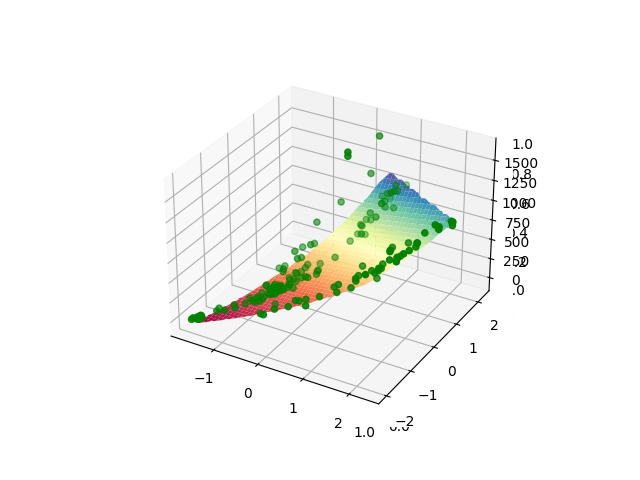

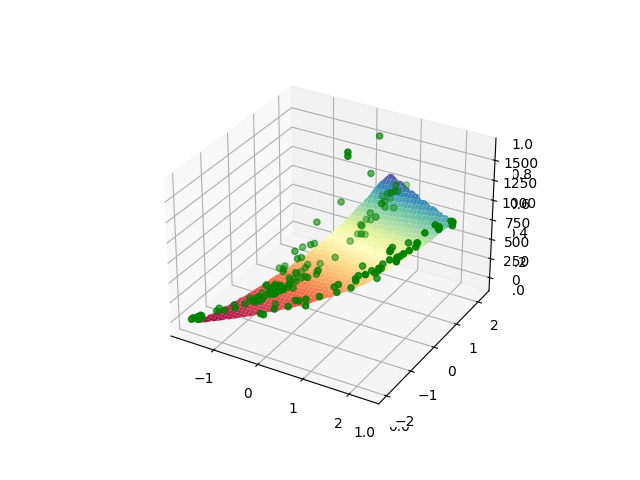

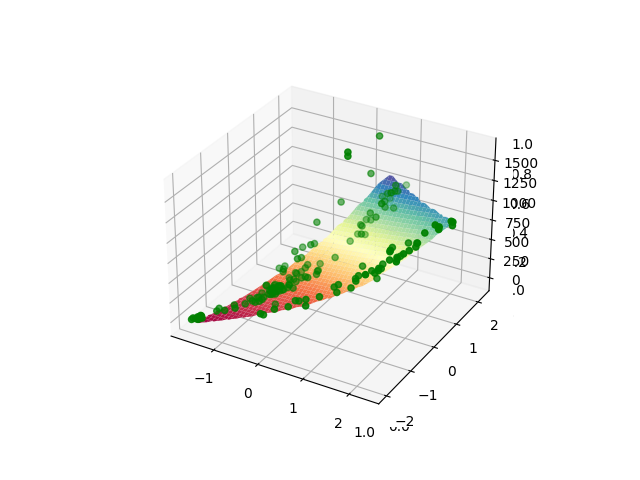

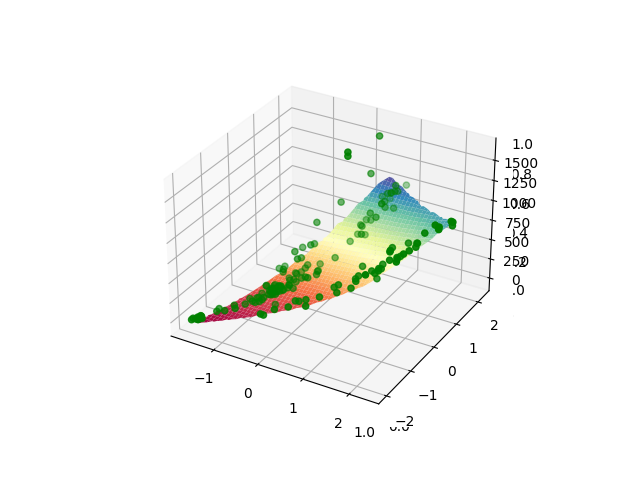

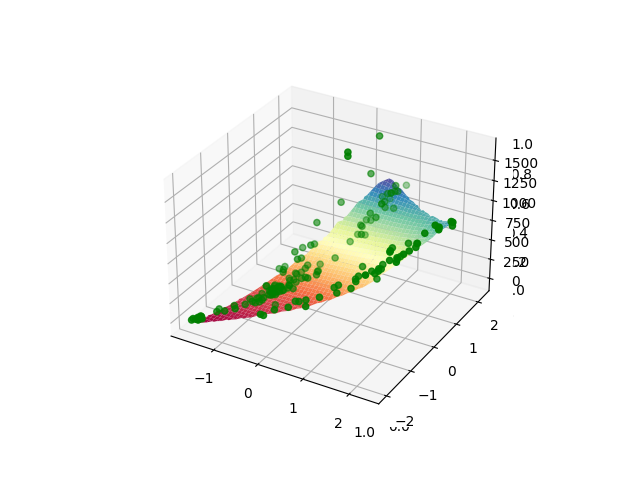

In [ ]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

#### Q = 4

Final Estimate of b and theta :  [] 390.3332098436963
-0.010586953439360114


Final Estimate of b and theta :  [ 64.45717838 247.99027211] 388.4590613923443
0.7390715701969177


Final Estimate of b and theta :  [-58.95247627  76.08572785 173.33761857 108.16647765  31.73071695] 391.01545393239445
0.7692038035278084


Final Estimate of b and theta :  [-22.59786837  54.06209658  92.77524358  35.59286871   2.61850689
  97.18184149  54.01730549  19.22061608   6.8186185 ] 392.3514846329085
0.7455654434537797


Final Estimate of b and theta :  [-8.24628398 60.54370132 79.90200342 31.80294095  8.89933105 69.03604374
 32.67188695 10.50885297  9.03403793 41.79754779 13.15409238 -4.1206844
 -4.72683474  4.85463934] 392.64033512518716
0.7374868821023951


Final Estimate of b and theta :  [-13.4595576   62.08988859  82.44476683  31.50022654   7.03957304
  71.01762514  35.48543268  14.22549018  11.96913246  42.99420709
  17.58772874   3.06482211   2.98597004  11.35623029   7.68104767
 -11.08416649 -

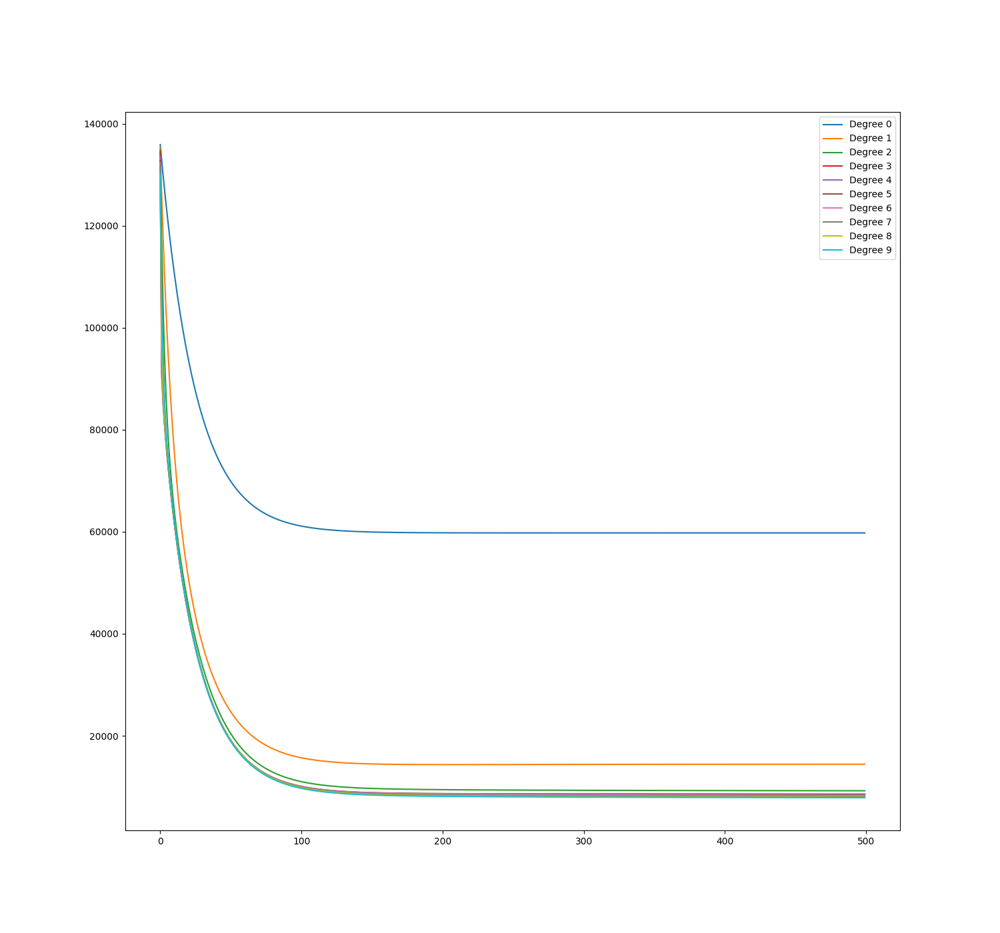

In [ ]:
theta_plot = []
b_plot = 0
all_b = []
all_theta = []
train_errors3 = []
test_errors3 = []
plt.figure(figsize=(15,14))
Q= 4
_lambda=1e-6 #lambda
costs = []
for i in range(1,11):

    num = i*(i+1)//2 -1
    
    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]

    b ,theta , cost_curve = run_gradient_descent(Xi_train , Y_train , alpha=0.02 , num_iterations=500)
    y_train_pred = predict_Y(b , theta , Xi_train)
    y_test_pred = predict_Y(b , theta , Xi_test)
    train_errors3.append(get_error_value(Y_train , y_train_pred))
    test_errors3.append(get_error_value(Y_test , y_test_pred))
    b_plot , theta_plot = b , theta
    all_b.append(b)
    all_theta.append(theta)
    costs.append(cost_curve[-1])
    print(r2_score(Y_test , predict_Y(b, theta, Xi_test)))
    print('\n')
    plt.plot(cost_curve , label=f'Degree {i-1}')
plt.legend()
print('\n')
print(f'Minimum Cost Function Value: {min(cost_curve)}')  

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

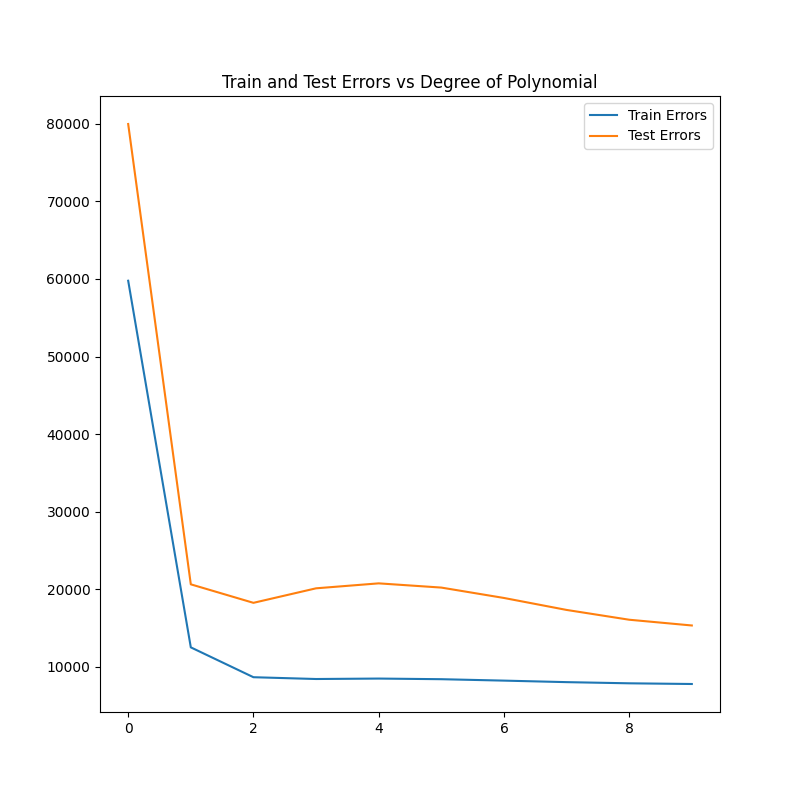

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(train_errors3 , label = "Train Errors")
plt.plot(test_errors3 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

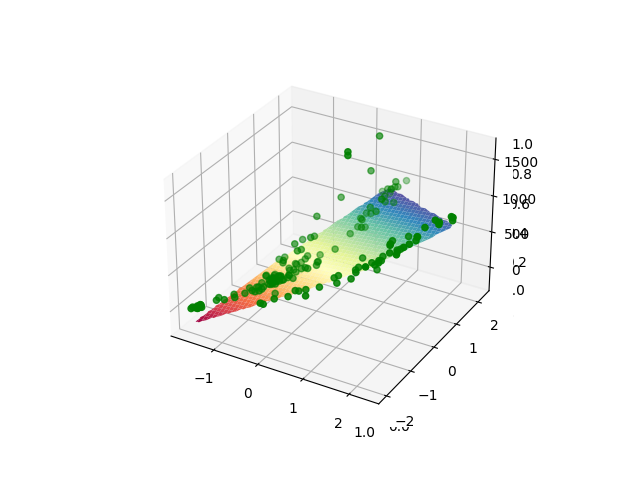

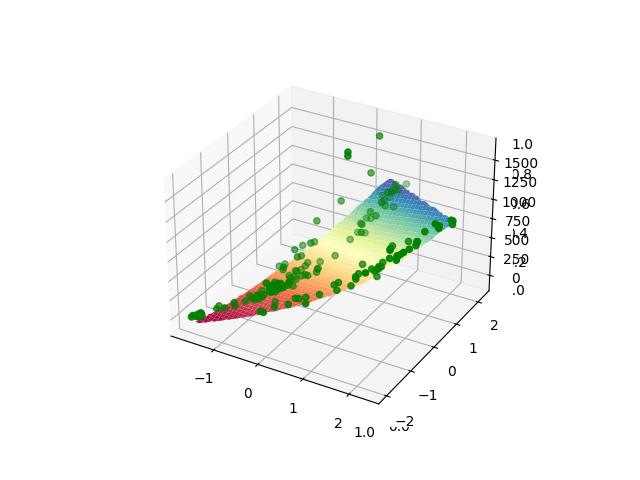

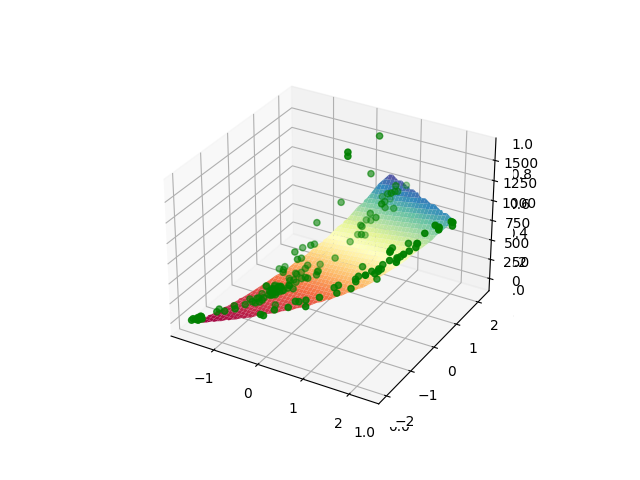

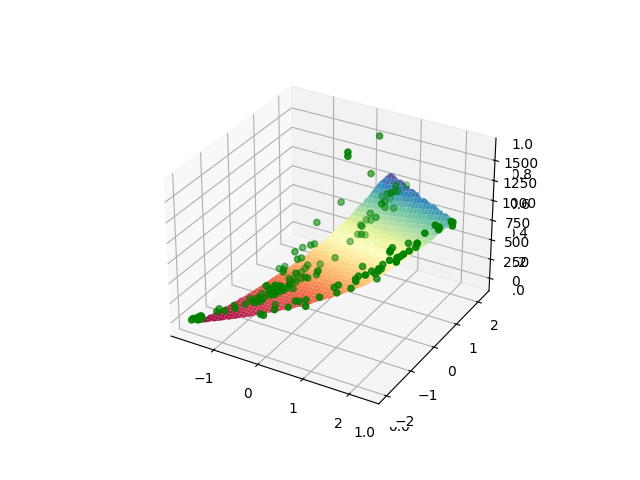

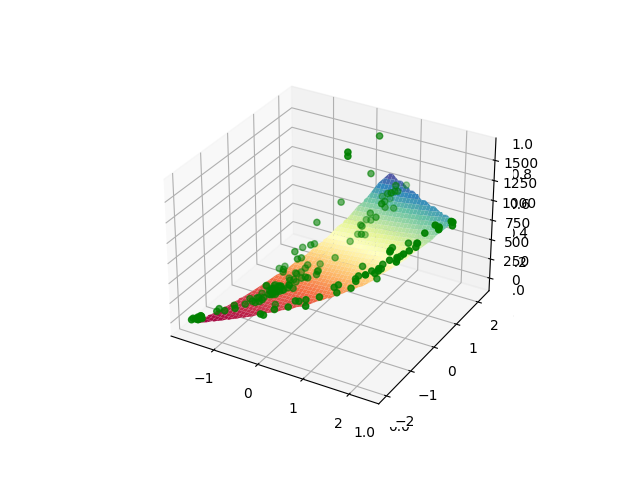

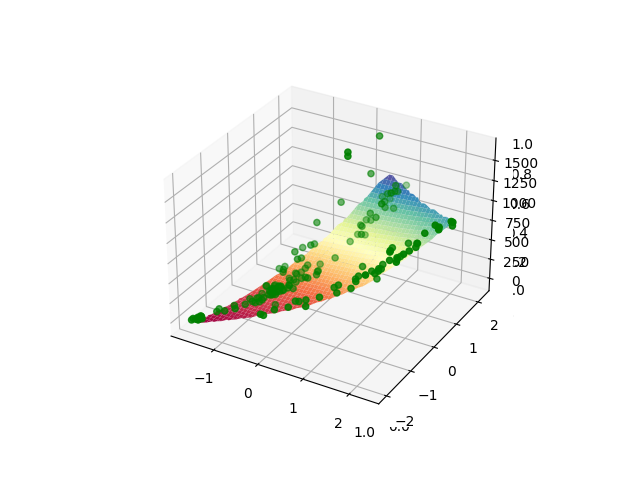

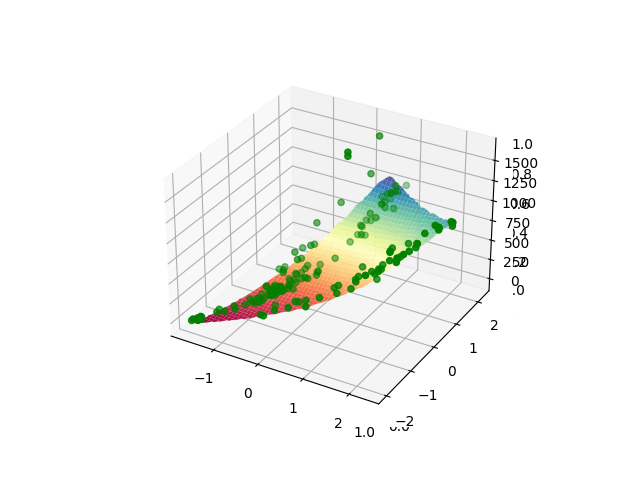

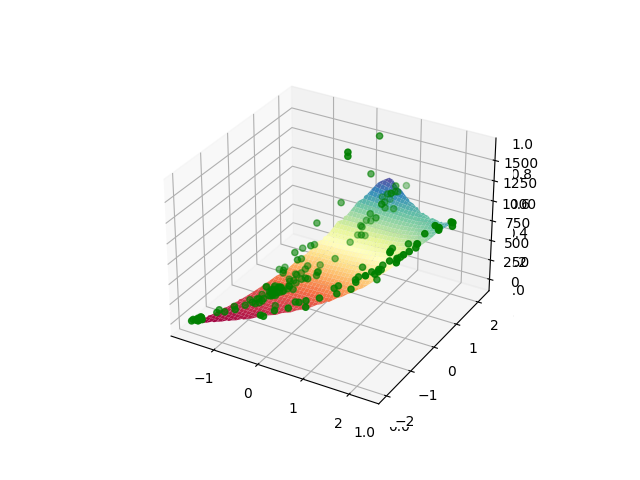

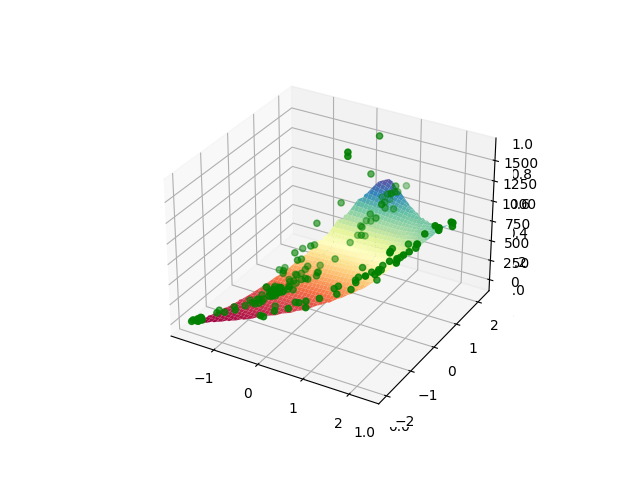

In [ ]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

### Stochastic Gradient Descent

A popular variation of the gradient descent optimization approach for machine learning model training is called Stochastic Gradient Descent (SGD). One training example at a time is processed by SGD, which incrementally changes the model parameters in contrast to Batch Gradient Descent, which processes the whole training dataset in each iteration. 

<li>Shuffle the training dataset randomly. This randomization helps to introduce variability in the training examples and prevents the algorithm from getting stuck in local minima.
<li>Calculate the gradient of the cost function J(θ) with respect to each parameter θₖ using the current training example (xᵢ, yᵢ). This is done by taking the partial derivatives of J(θ) with respect to each θₖ: ∂J(θ) / ∂θₖ for all k = 0, 1, 2, ..., n .
The gradients represent the direction of steepest ascent in the cost function based on the current training example.
<li>Adjust the model parameters θ in the opposite direction of the gradients to minimize the cost function. This is done using the learning rate (α) and the gradients from the current training example: θₖ := θₖ - α * ∂J(θ) / ∂θₖ for all k.

### Evaluation of Stochastic Gradient Descent

### Q = 0.5

Final Estimate of b and theta :  390.3491239289438 []
-0.01057872262817905


Final Estimate of b and theta :  388.76198732930754 [ 37.58696953 284.89550215]
0.7515793529785648


Final Estimate of b and theta :  391.19172490142137 [-45.84649038  67.3750572  191.58342701  95.19605708  24.76382654]
0.7687656145904078


Final Estimate of b and theta :  392.413957194559 [-17.97440096  52.32214798  91.91358181  34.50739166   1.39204635
  99.51287616  54.36141536  19.29205287   3.99529891]
0.7450494771060578


Final Estimate of b and theta :  392.7089104801813 [-2.80804526 59.70502928 76.21656627 30.87885369  7.1351523  65.08356897
 33.50437759 10.74997242  5.59812844 41.30424845 18.67744158  0.84653148
 -4.50230873 -0.2549214 ]
0.7356825147423023


Final Estimate of b and theta :  392.60733311368585 [ -6.54186079  62.08316191  77.16321471  32.35145401   7.05325858
  63.543378    35.77016997  14.59466451   8.085872    37.41343574
  19.3236896    6.31212175   1.76111209   5.4011554    6.712779

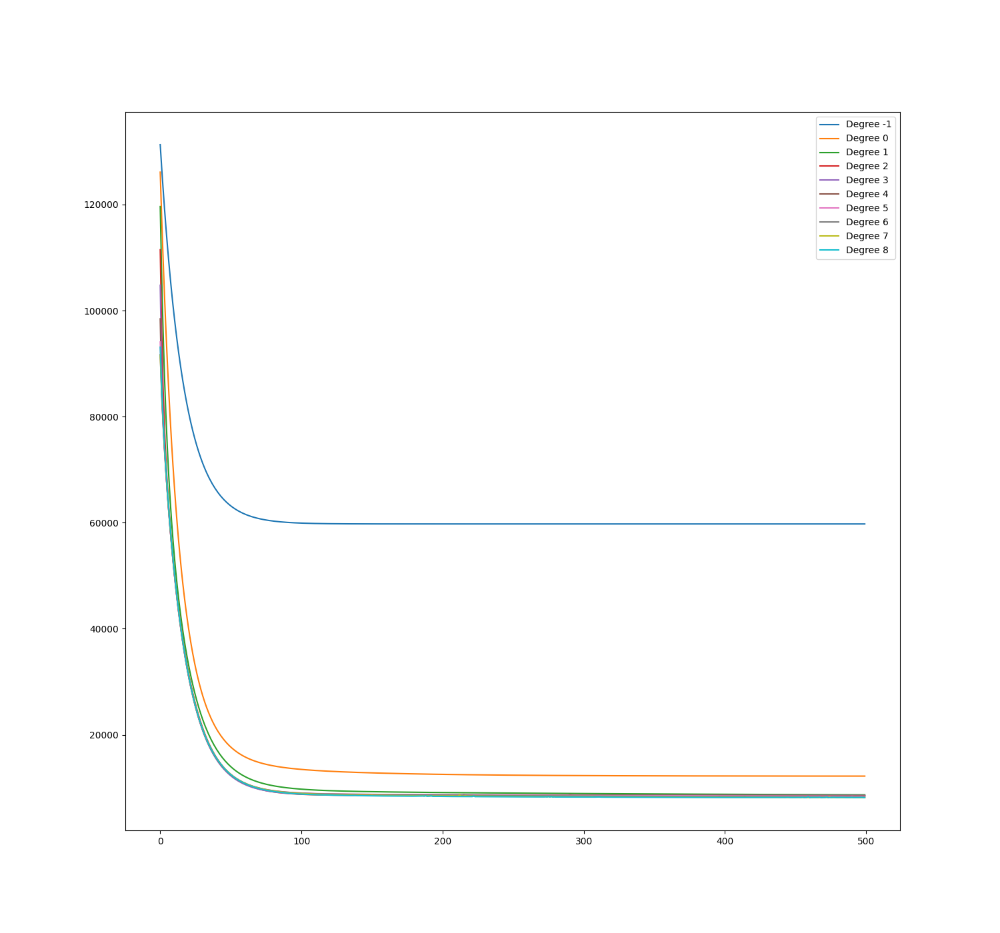

In [ ]:
plt.figure(figsize=(15,14))
best_b1 = None
best_theta1 = None
best_r2_score1 = 0
train_errors5 = []
test_errors5 = []
r2_scores = []
costs = []

all_b = []
all_theta = []
Q=0.5
_lambda=0.9 #Lambda
for i in range(0,10):

    num = (i+2)*(i+1)//2 -1

    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]


    b_sgd , theta_sgd , cost_curve_sgd = run_gradient_descent_SGD(Xi_train , Y_train , alpha=0.03 , num_iterations=500 , k = 1)
    b_plot , theta_plot = b , theta
    all_b.append(b_sgd)
    all_theta.append(theta_sgd)
    y_train_pred = predict_Y(b_sgd , theta_sgd , Xi_train)
    y_test_pred = predict_Y(b_sgd , theta_sgd , Xi_test)
    train_errors5.append(get_cost(Y_train , y_train_pred , theta_sgd))
    test_errors5.append(get_cost(Y_test , y_test_pred , theta_sgd))
    r2 = r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test))
    if r2 > best_r2_score1:
        best_r2_score1 = r2
        best_b1 = b_sgd
        best_theta1 = theta_sgd
    r2_scores.append(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    costs.append(cost_curve_sgd[-1])
    print(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    print('\n')
    plt.plot(cost_curve_sgd , label=f'Degree {i-1}')

plt.legend()
print(min(costs))

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

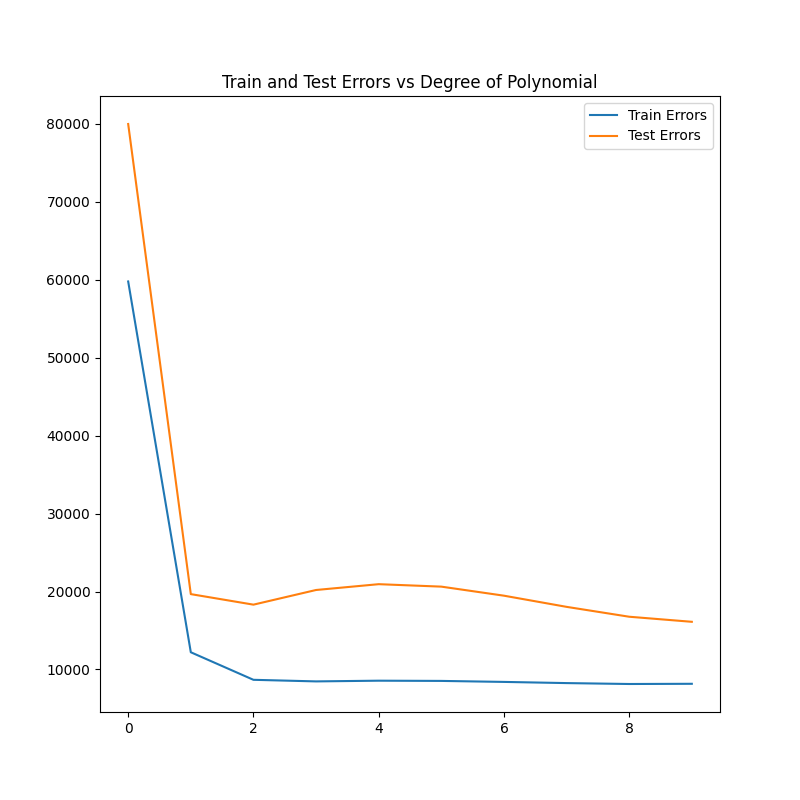

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(train_errors5 , label = "Train Errors")
plt.plot(test_errors5 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

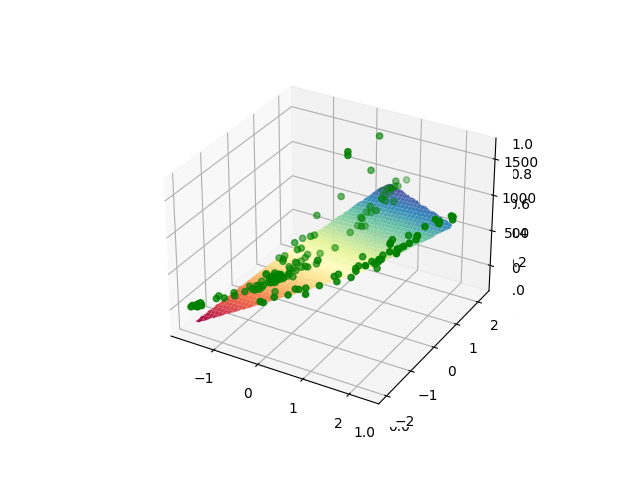

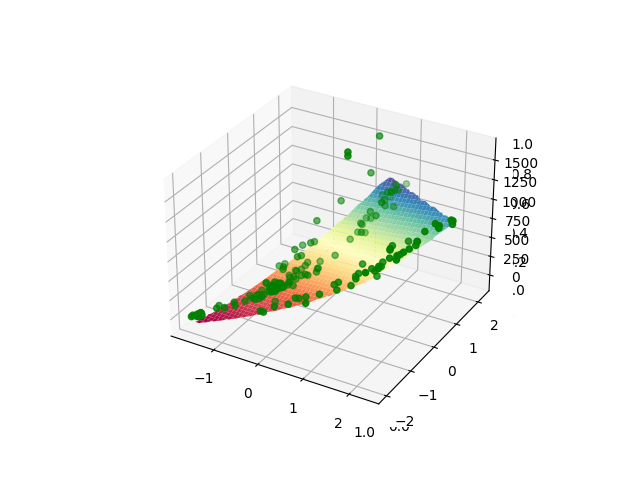

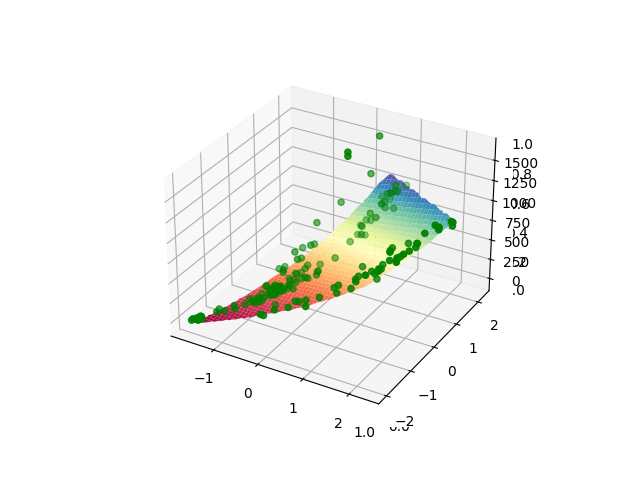

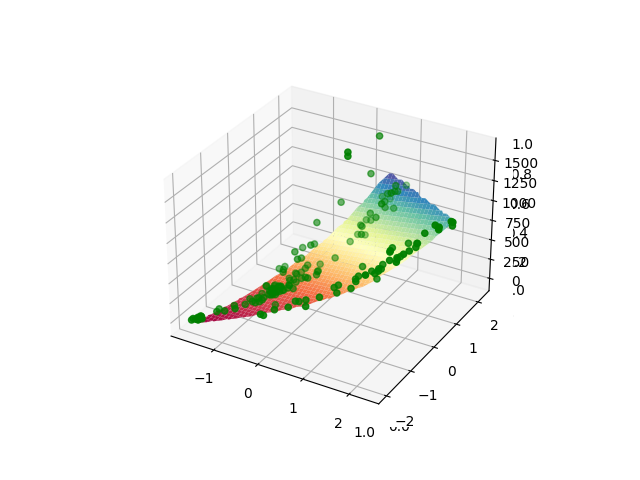

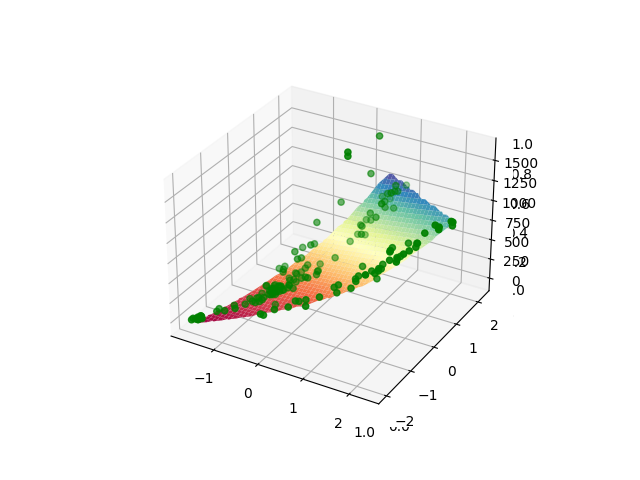

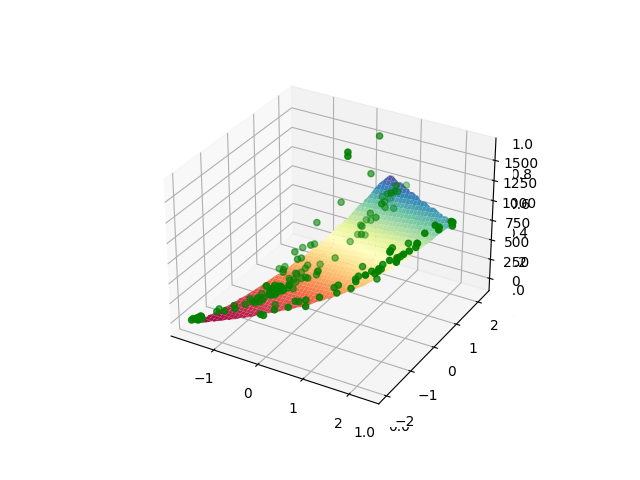

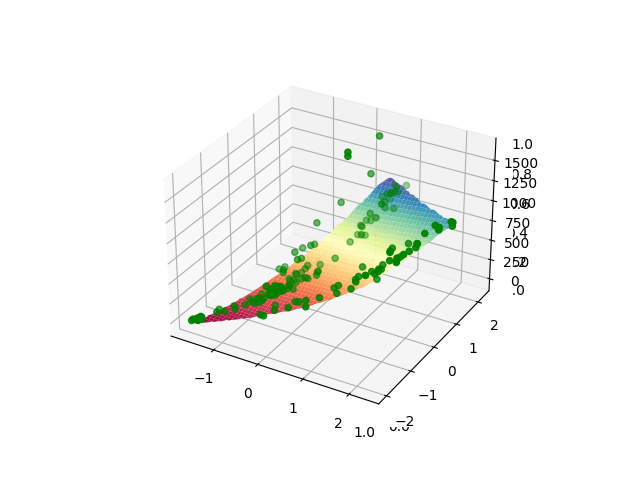

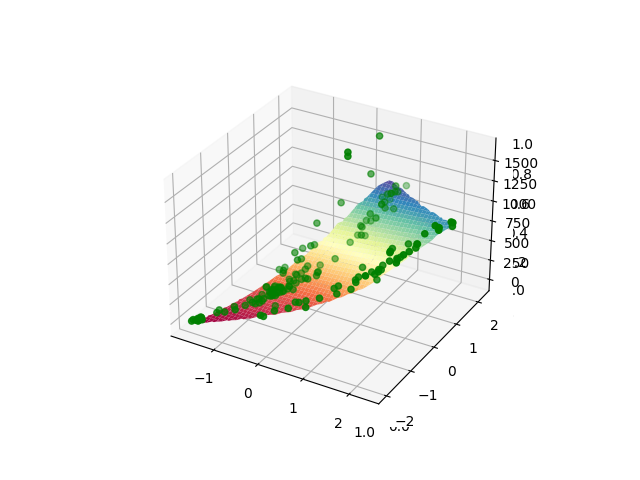

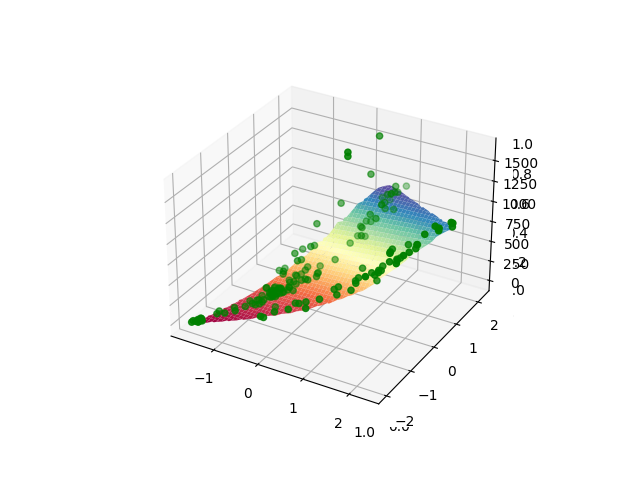

In [ ]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

### Q = 1

Final Estimate of b and theta :  388.7665230620417 [ 37.367027   284.59957247]
0.7516274420538102


Final Estimate of b and theta :  391.1949463931029 [-46.24835641  67.4032908  190.72575527  95.40850427  24.45960305]
0.7689869799005598


Final Estimate of b and theta :  392.41990703387944 [-18.31764365  51.53574708  91.37193669  36.08970476   0.94248819
  98.01112747  55.5205255   19.2607765    2.5132738 ]
0.7454373660346156


Final Estimate of b and theta :  392.7062062603725 [-3.58634753 58.69241278 75.59779229 33.13421246  7.00900767 62.90455145
 35.46669526 12.45103856  3.34245106 38.43217333 19.69327383  3.22066304
 -4.13060148 -4.13517679]
0.7361850375108725


Final Estimate of b and theta :  392.59291028692707 [-7.63970264 60.05939225 76.33548802 35.42286676  6.12002528 61.66193181
 38.58470322 16.410846    6.22906344 34.418452   22.04526678  9.24397292
  2.46389251  1.67071497  1.93201349 -4.12231397 -7.4607534  -9.19721972
 -6.83591123 -2.4066951 ]
0.7408851556424911


Final 

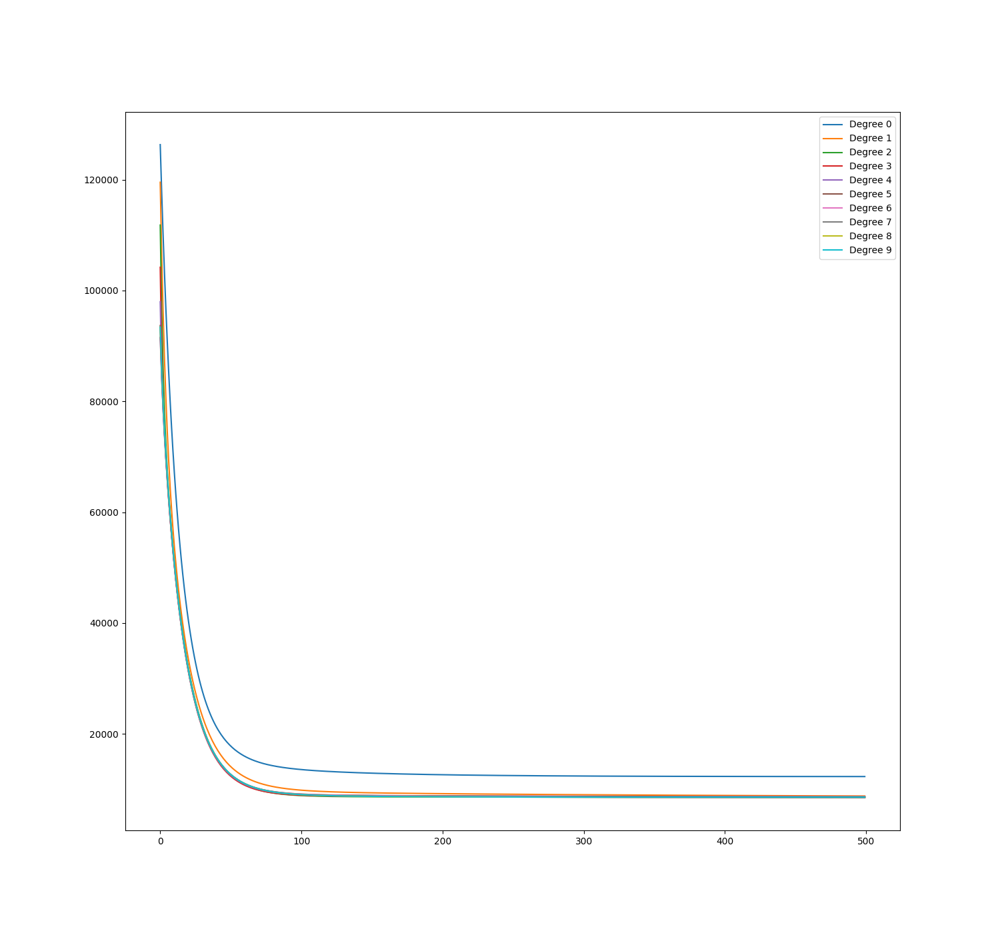

In [ ]:

plt.figure(figsize=(15,14))
best_b2 = None
best_theta2 = None
best_r2_score2 = 0
train_errors6 = []
test_errors6 = []
r2_scores = []
costs = []

all_b = []
all_theta = []
Q=1
_lambda=0.5 #Lambda
for i in range(1,11):

    num = (i+2)*(i+1)//2 -1

    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]
    all_b.append(b_sgd)
    all_theta.append(theta_sgd)

    b_sgd , theta_sgd , cost_curve_sgd = run_gradient_descent_SGD(Xi_train , Y_train , alpha=0.03 , num_iterations=500 , k = 1)
    y_train_pred = predict_Y(b_sgd , theta_sgd , Xi_train)
    y_test_pred = predict_Y(b_sgd , theta_sgd , Xi_test)
    train_errors6.append(get_cost(Y_train , y_train_pred , theta_sgd))
    test_errors6.append(get_cost(Y_test , y_test_pred , theta_sgd))
    r2 = r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test))
    if r2 > best_r2_score2:
        best_r2_score2 = r2
        best_b2 = b_sgd
        best_theta2 = theta_sgd
    r2_scores.append(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    costs.append(cost_curve_sgd[-1])
    print(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    print('\n')
    plt.plot(cost_curve_sgd , label=f'Degree {i-1}')

plt.legend()
print(min(costs))

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

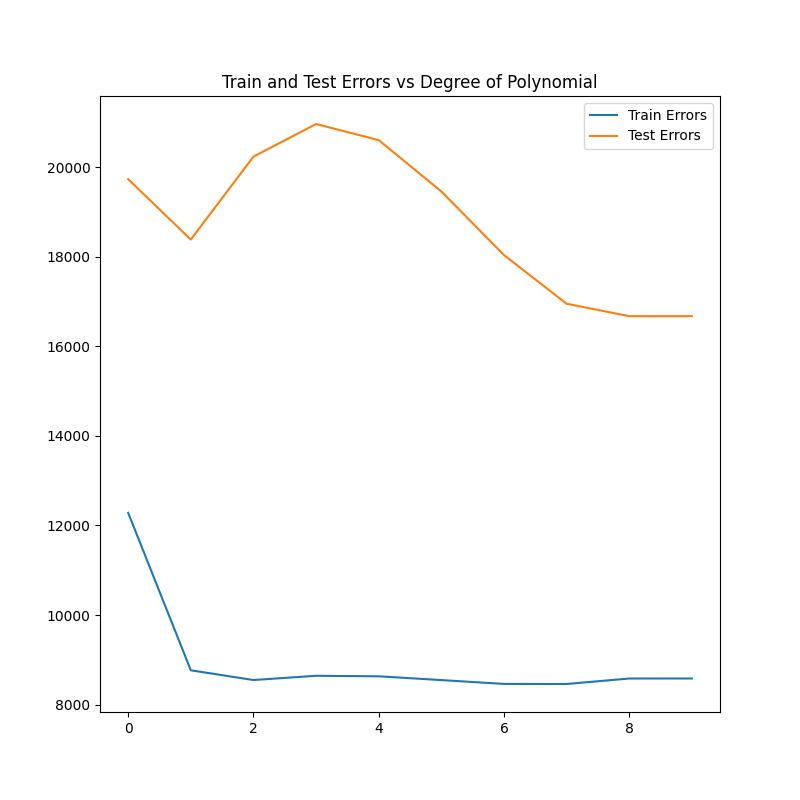

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(train_errors6 , label = "Train Errors")
plt.plot(test_errors6 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

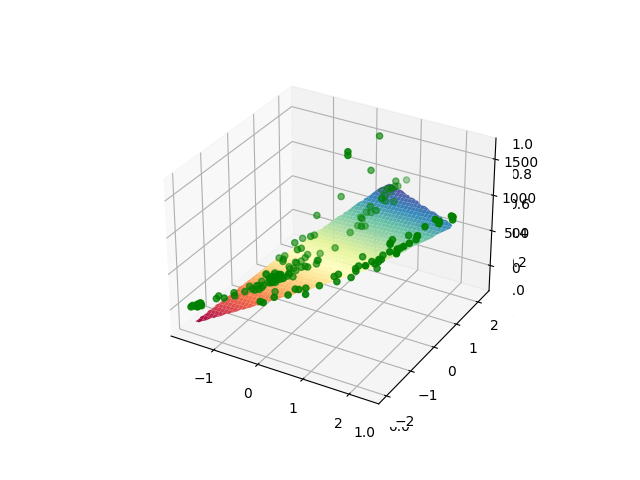

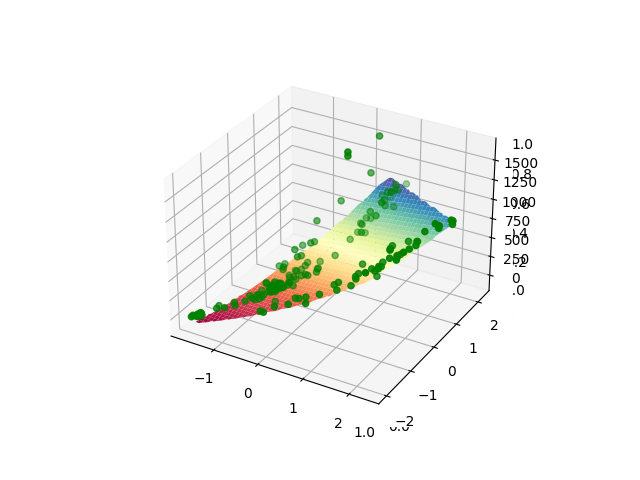

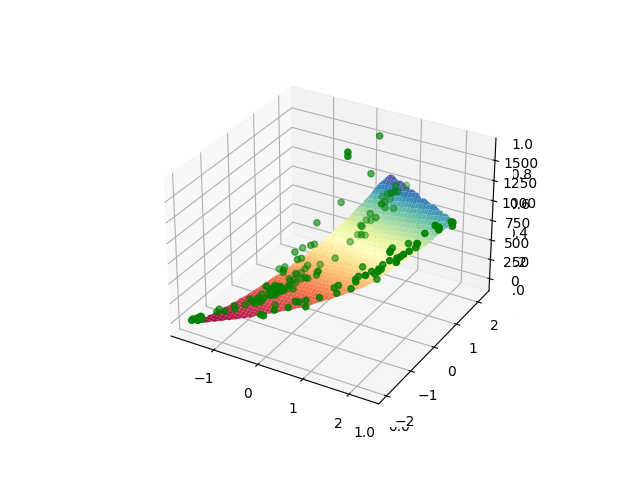

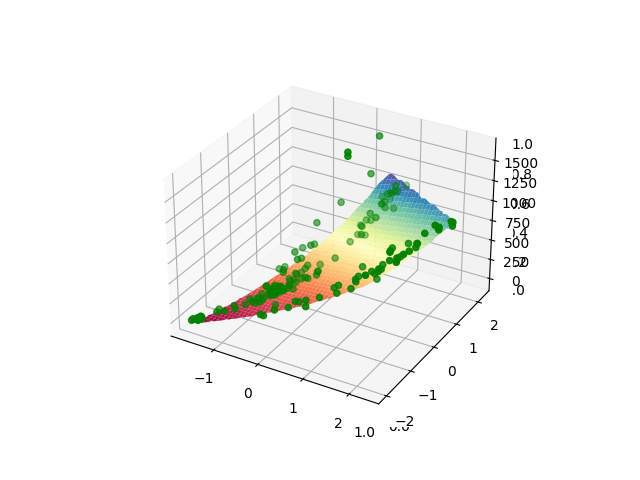

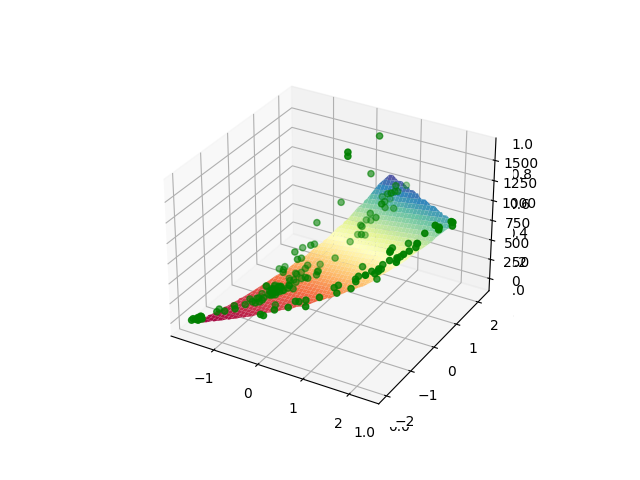

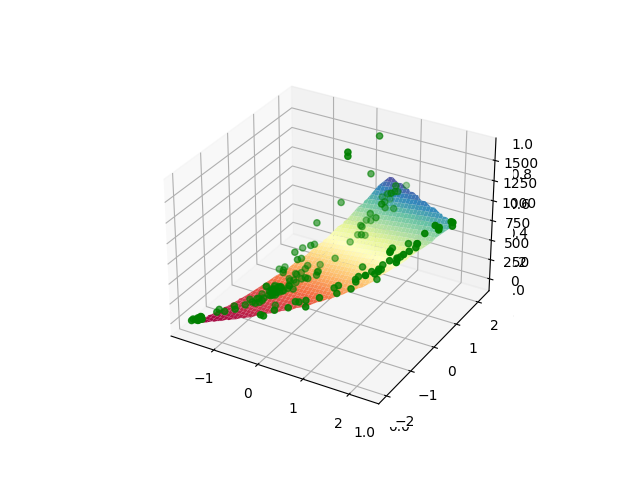

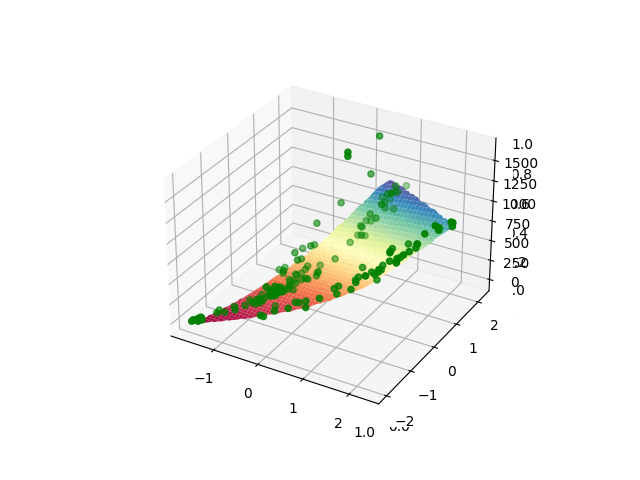

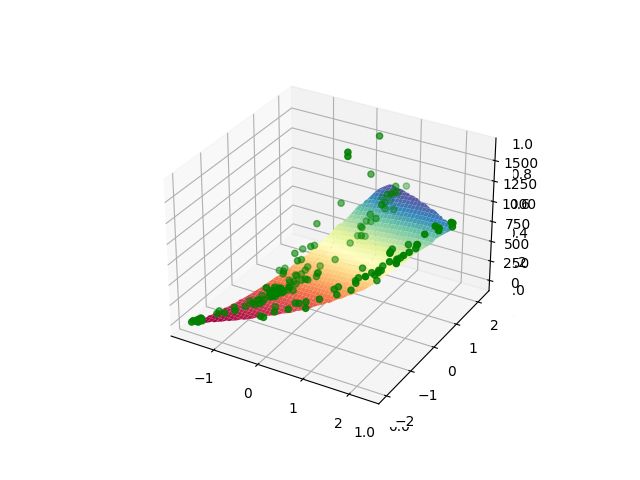

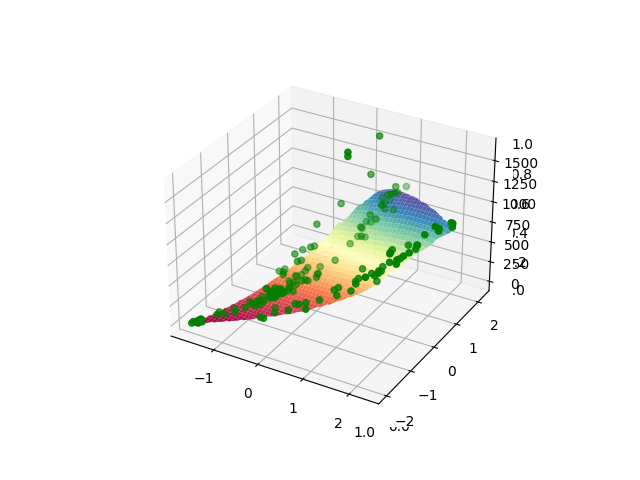

In [ ]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

### Q = 2

Final Estimate of b and theta :  388.79301948609196 [ 36.08774761 282.79768958]
0.75183353375117


Final Estimate of b and theta :  391.21467378113715 [-46.60988135  66.03043855 189.04306416  97.35275652  22.27291226]
0.7693474404986753


Final Estimate of b and theta :  392.4222255657529 [-18.48463157  50.94699352  91.01925145  37.14882817   0.38270827
  96.31265646  56.57663663  20.26463226   0.60690101]
0.7457424086598275


Final Estimate of b and theta :  392.704901845283 [-3.76091339 58.53019393 75.37782943 33.66523271  6.84603651 63.22408358
 35.89905841 12.50682586  3.2968089  38.27481179 19.15149927  3.10180806
 -3.89159033 -4.35068723]
0.7362854031318381


Final Estimate of b and theta :  392.59919341137163 [ -6.99373854  60.69968208  76.24959039  34.71823868   5.92469286
  62.79540927  37.15841219  16.20611017   6.54037715  35.08536409
  20.57707608   8.89502021   2.12231331   2.97225993   3.89580428
  -3.69789618  -8.93981116 -10.03695679  -6.66542123  -0.27023984]
0.7406254

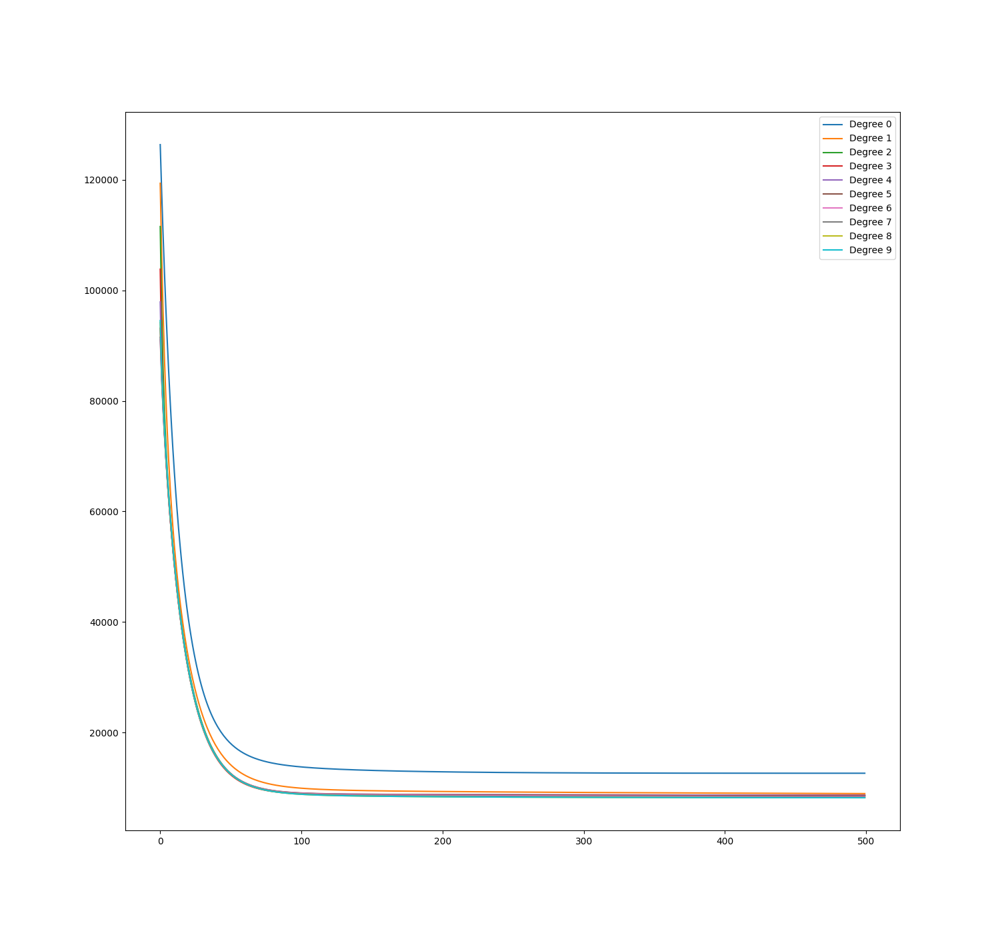

In [ ]:
plt.figure(figsize=(15,14))
best_b3 = None
best_theta3 = None
best_r2_score3 = 0
train_errors7 = []
test_errors7 = []
r2_scores = []
costs = []
all_b = []
all_theta = []
Q=2
_lambda=0.01 #Lambda
for i in range(1,11):

    num = (i+2)*(i+1)//2 -1

    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]
    all_b.append(b_sgd)
    all_theta.append(theta_sgd)



    b_sgd , theta_sgd , cost_curve_sgd = run_gradient_descent_SGD(Xi_train , Y_train , alpha=0.03 , num_iterations=500 , k = 1)
    y_train_pred = predict_Y(b_sgd , theta_sgd , Xi_train)
    y_test_pred = predict_Y(b_sgd , theta_sgd , Xi_test)
    train_errors7.append(get_cost(Y_train , y_train_pred , theta_sgd))
    test_errors7.append(get_cost(Y_test , y_test_pred , theta_sgd))
    r2 = r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test))
    if r2 > best_r2_score3:
        best_r2_score3 = r2
        best_b3 = b_sgd
        best_theta3 = theta_sgd
    r2_scores.append(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    costs.append(cost_curve_sgd[-1])
    print(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    print('\n')
    plt.plot(cost_curve_sgd , label=f'Degree {i-1}')

plt.legend()
print(min(costs))

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

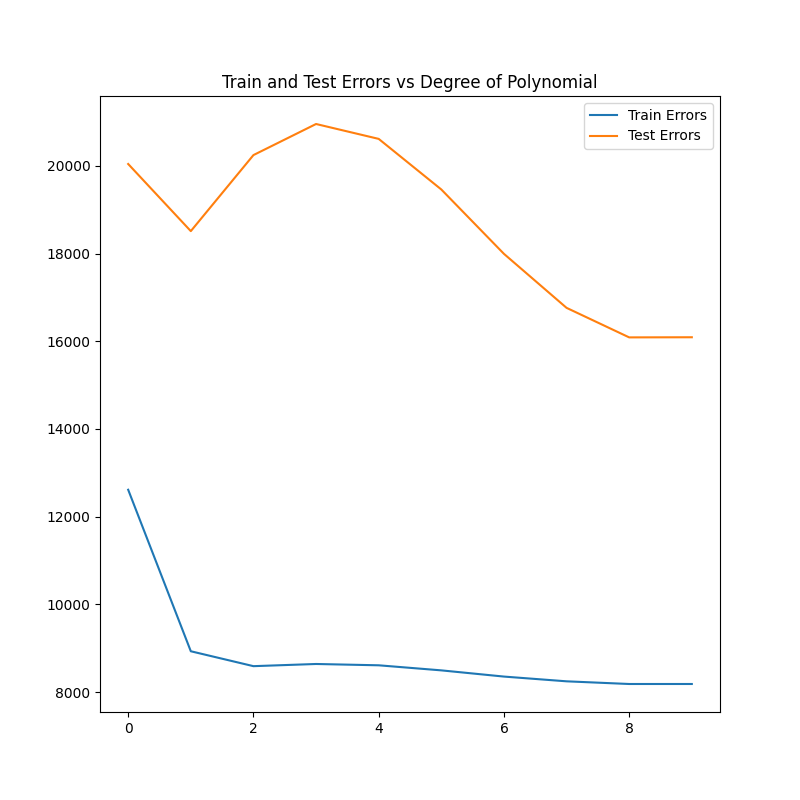

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(train_errors7 , label = "Train Errors")
plt.plot(test_errors7 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

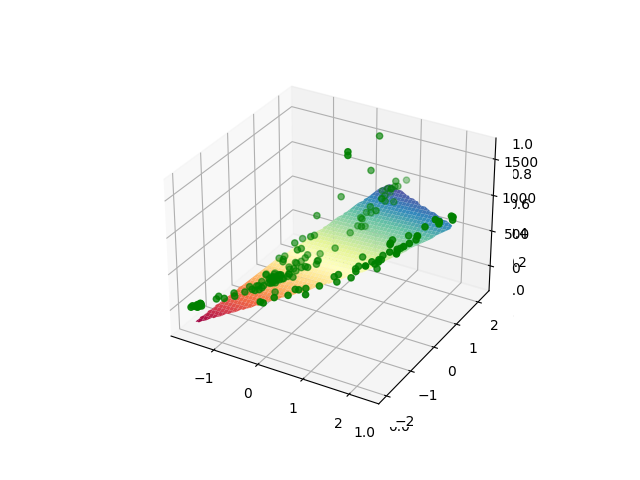

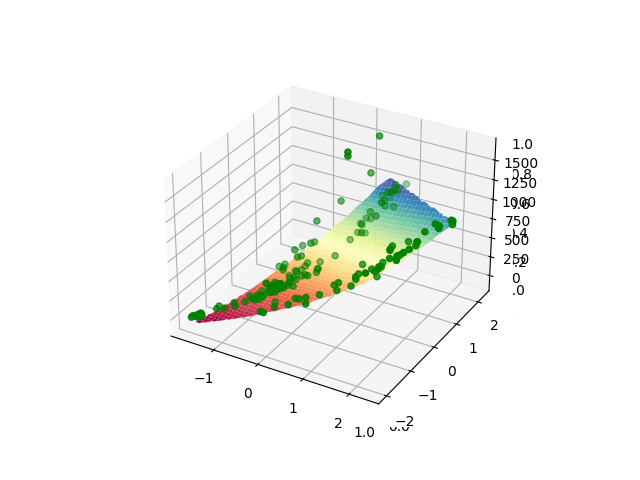

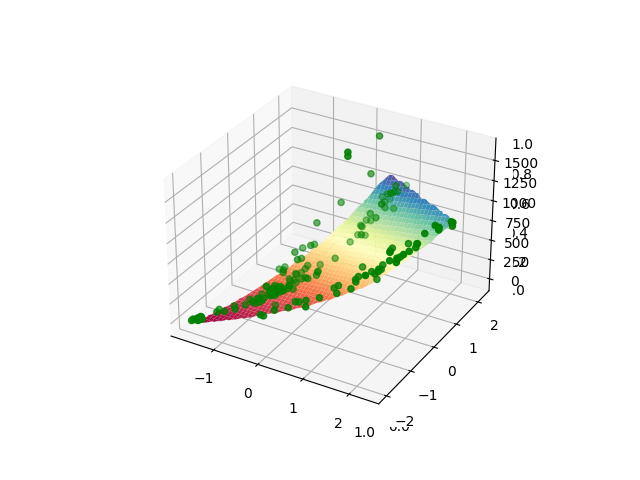

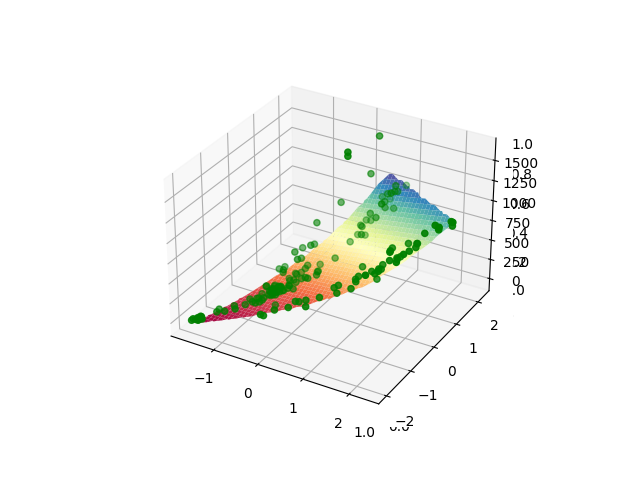

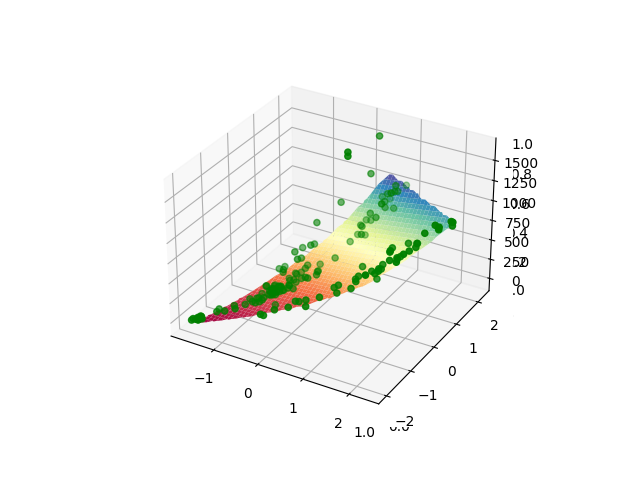

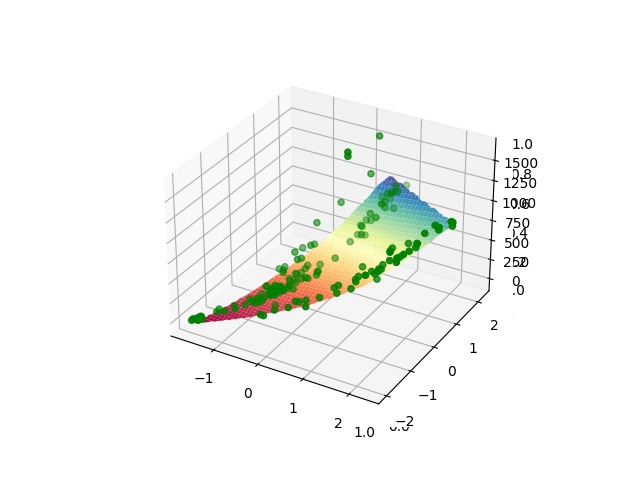

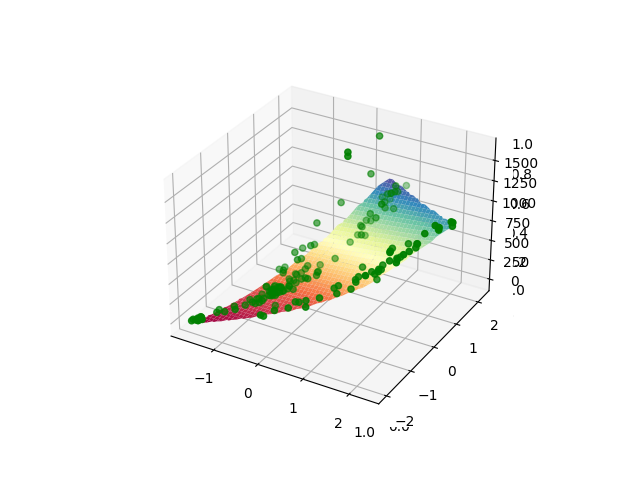

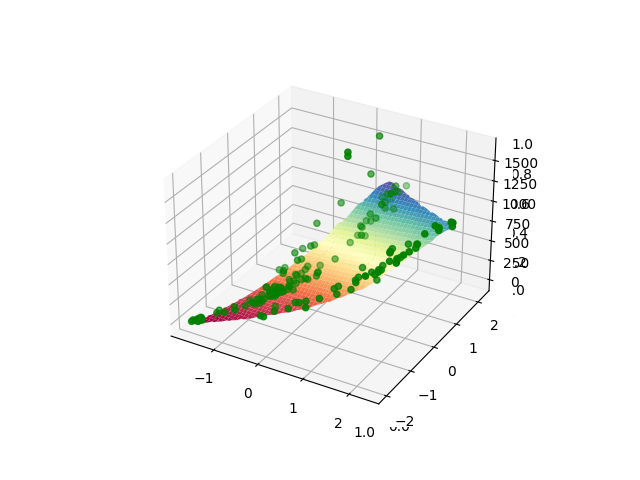

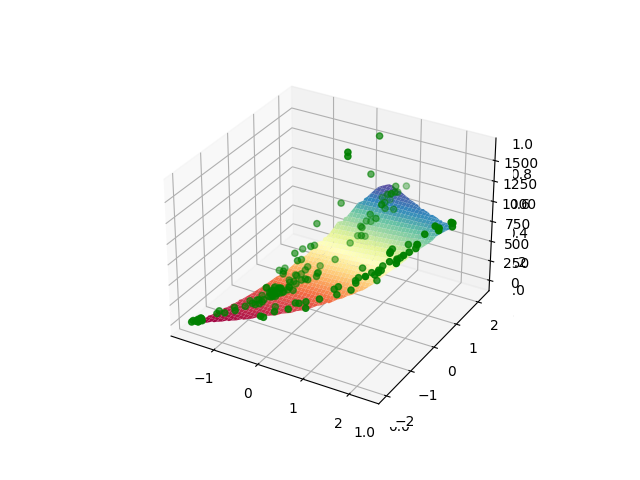

In [ ]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

### Q = 4

Final Estimate of b and theta :  389.11340336192666 [ 20.18705724 261.6151601 ]
0.7449916907527754


Final Estimate of b and theta :  391.27718215858516 [-48.62862756  62.43437873 183.46974269 100.81105382  16.95026858]
0.769612127571376


Final Estimate of b and theta :  392.4232229933102 [-18.46060313  50.92746136  91.02415924  36.8712969    0.44973742
  96.79947582  55.82054742  20.00345266   1.06884492]
0.7458728310760001


Final Estimate of b and theta :  392.70523259650645 [-3.44834942 59.47245094 75.91946516 32.11537405  7.35307688 65.03001269
 33.37810545 11.24161486  4.69257321 40.76105197 18.08186827  1.65533972
 -4.44759635 -0.8861171 ]
0.7360369240409885


Final Estimate of b and theta :  392.6105570966414 [ -6.13059329  62.22025793  77.04840661  32.30516653   7.15763026
  63.44718554  34.98142002  13.9648757    7.70967896  37.80123817
  18.78897257   5.98227719   1.93764737   5.85241599   7.9941553
  -4.45757227 -10.9982515  -10.6597309   -5.68054196   2.91767581]
0.740053

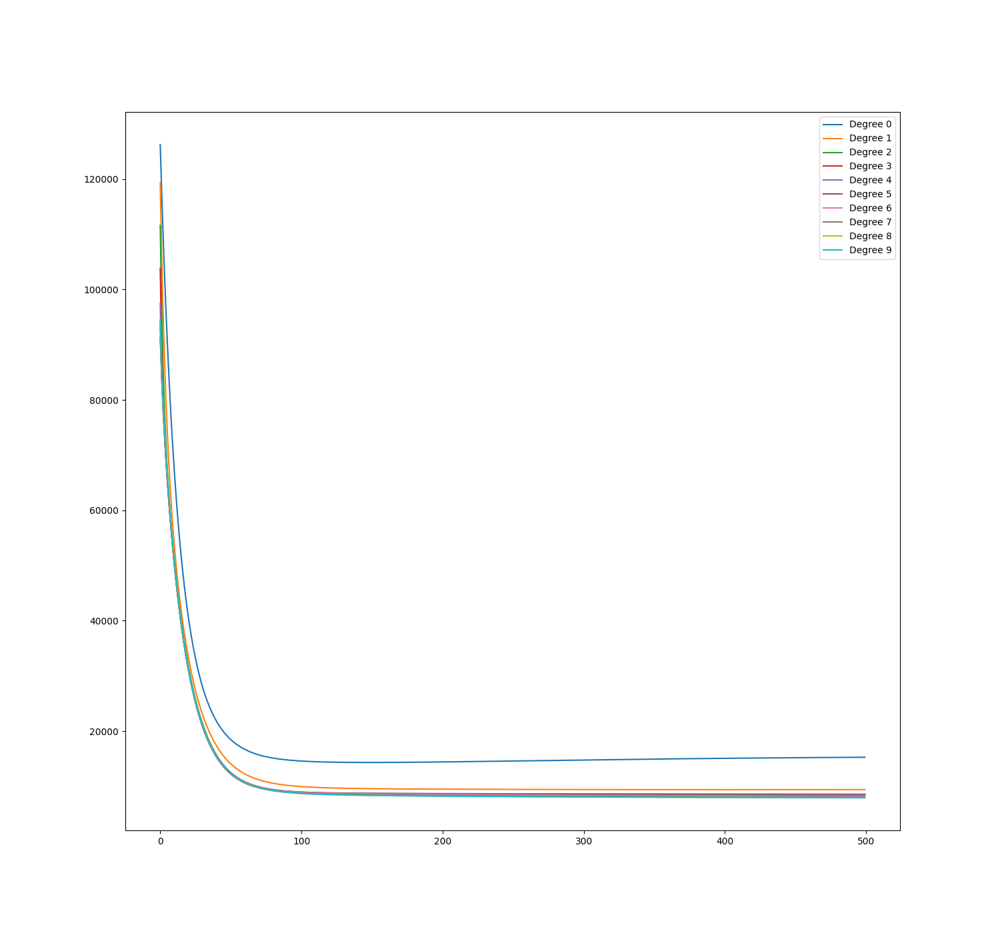

In [ ]:
plt.figure(figsize=(15,14))
best_b4 = None
best_theta4 = None
best_r2_score4 = 0
train_errors8 = []
test_errors8 = []
r2_scores = []
costs = []
all_b = []
all_theta = []
Q=4
_lambda=1e-6 #Lambda
for i in range(1,11):

    num = (i+2)*(i+1)//2 -1

    Xi_train = X_train[:,:num]
    Xi_test= X_test[:,:num]
    all_b.append(b_sgd)
    all_theta.append(theta_sgd)


    b_sgd , theta_sgd , cost_curve_sgd = run_gradient_descent_SGD(Xi_train , Y_train , alpha=0.03 , num_iterations=500 , k = 1)
    y_train_pred = predict_Y(b_sgd , theta_sgd , Xi_train)
    y_test_pred = predict_Y(b_sgd , theta_sgd , Xi_test)
    train_errors8.append(get_cost(Y_train , y_train_pred , theta_sgd))
    test_errors8.append(get_cost(Y_test , y_test_pred , theta_sgd))
    r2 = r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test))
    if r2 > best_r2_score4:
        best_r2_score4 = r2
        best_b4 = b_sgd
        best_theta4 = theta_sgd
    r2_scores.append(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    costs.append(cost_curve_sgd[-1])
    print(r2_score(Y_test , predict_Y(b_sgd , theta_sgd , Xi_test)))
    print('\n')
    plt.plot(cost_curve_sgd , label=f'Degree {i-1}')

plt.legend()
print(min(costs))
print(best_r2_score4)

Text(0.5, 1.0, 'Train and Test Errors vs Degree of Polynomial')

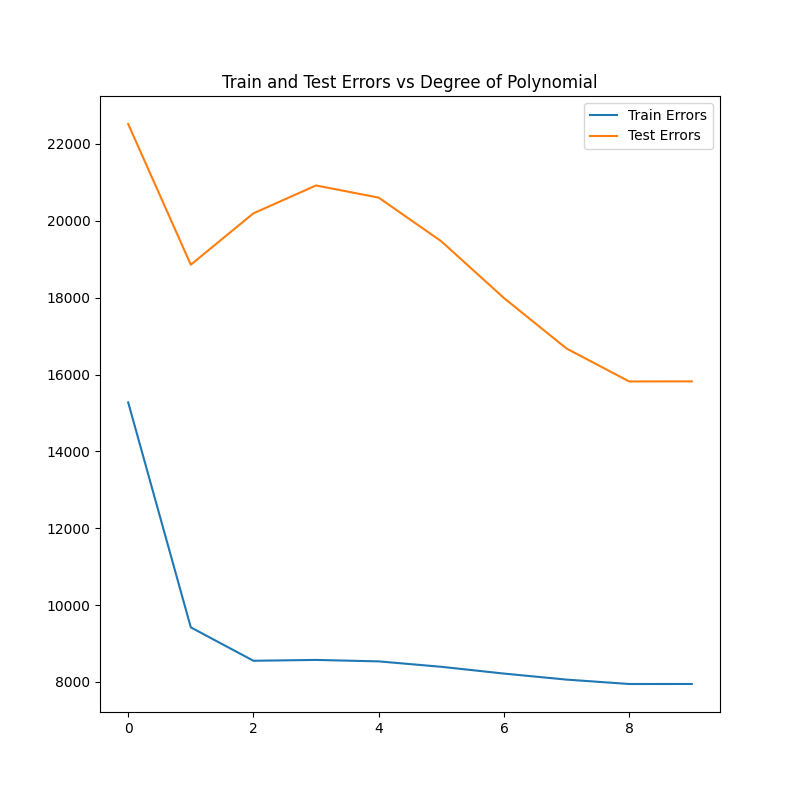

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(train_errors8 , label = "Train Errors")
plt.plot(test_errors8 , label = "Test Errors")
plt.legend()
plt.title("Train and Test Errors vs Degree of Polynomial")

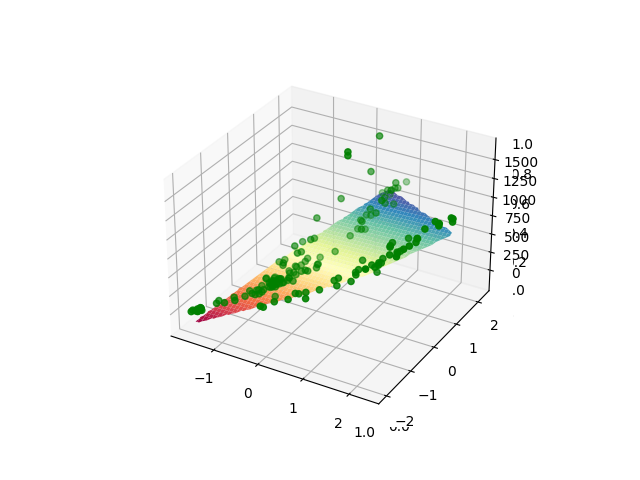

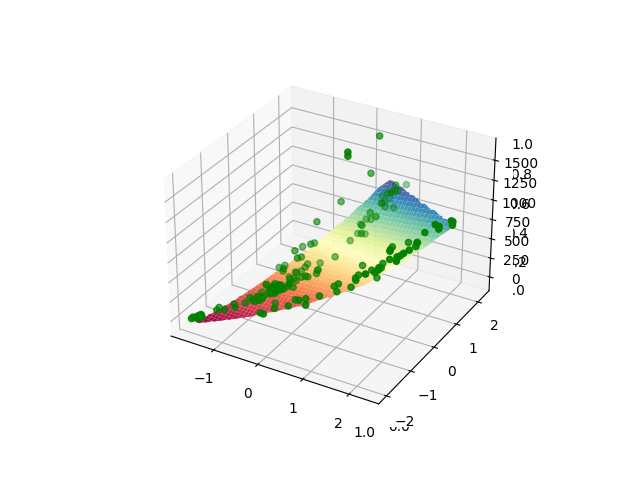

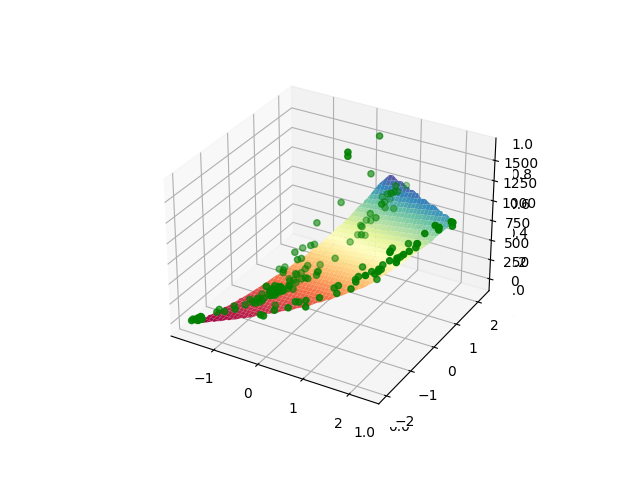

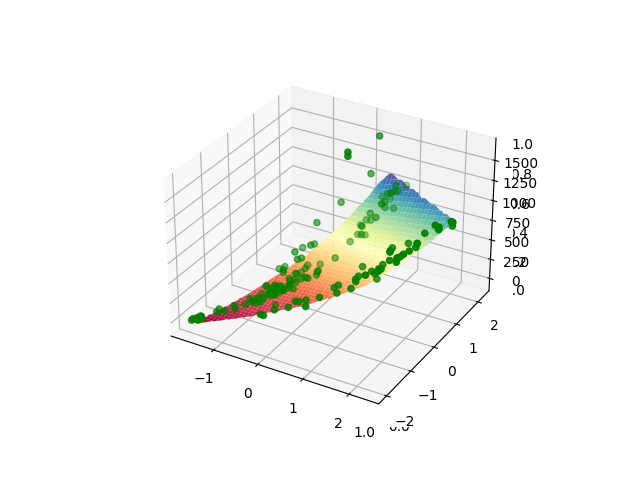

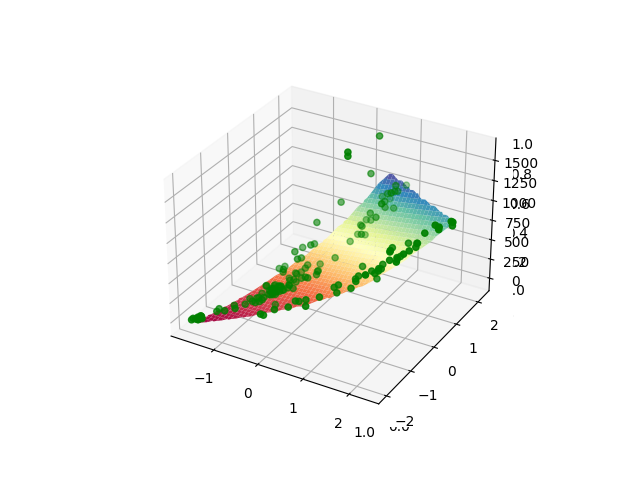

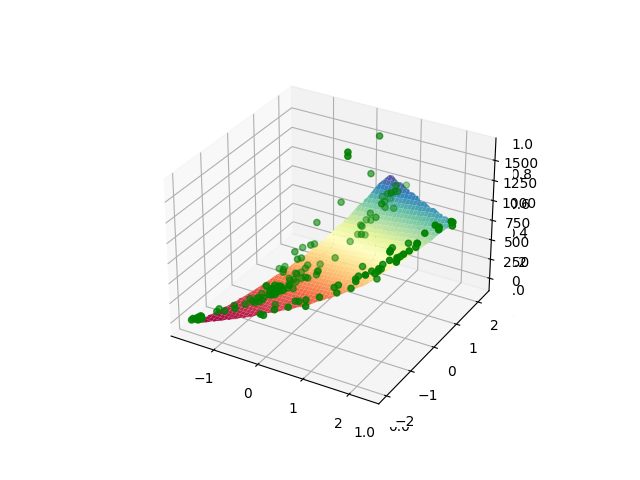

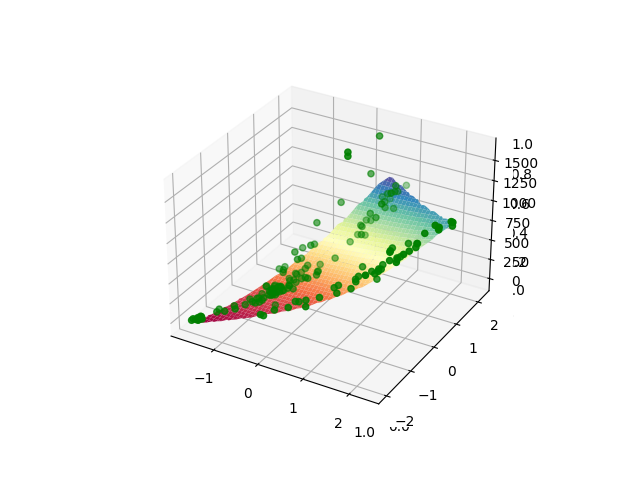

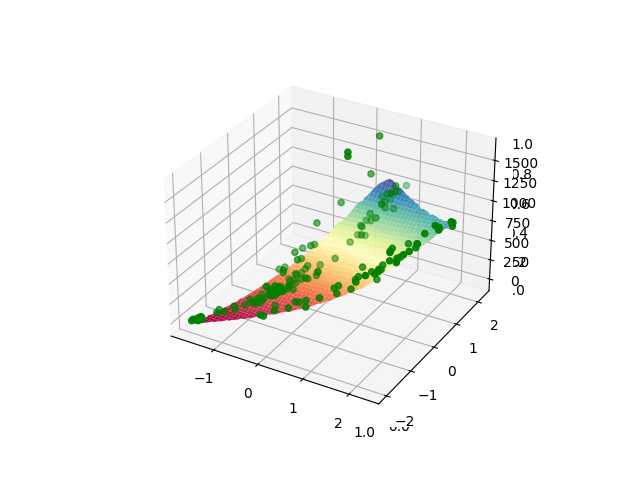

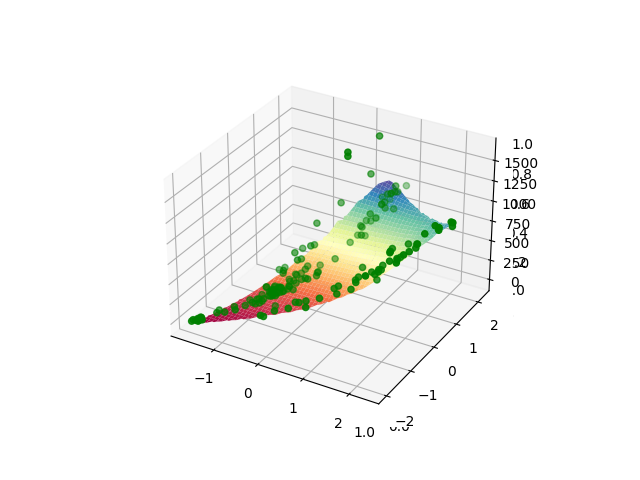

In [ ]:
%matplotlib widget

for i in range(2,11):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        num = i*(i+1)//2 -1
    
        Xi_train = X_train[:,:num]
       # Xi_test= X_test[:,:num]

        ex = X_train[:,0]
        waiy = X_train[:,1]
        zed = np.dot(Xi_train , all_theta[i-1]) + all_b[i-1]

        ex_actual = X[:,0]
        waiy_actual = X[:,1]
        zed_actual = Y
        grid_x , grid_y = np.mgrid[min(ex) : max(ex) : 100j, min(waiy) : max(waiy): 100j]
        grid_z = griddata((ex,waiy) , zed , (grid_x , grid_y) , method = 'cubic')

        ax = fig.add_subplot(projection = '3d')
        ax.scatter(ex_actual , waiy_actual , zed_actual , c = 'green' , marker = 'o')
        ax.plot_surface(grid_x , grid_y , grid_z , cmap = plt.cm.Spectral)

# Comparative Analysis Study:

Here, we will go in further depth of all 4 optimised regression models.

Before that, let us see what the results are, after that we will draw conclusions out of the results.

## Results:

NOTE: The degree is decided based on the highest R2 score.

(R2 score: The R-squared (R2) score, also known as the coefficient of determination, is a statistical measure that assesses a regression model's goodness of fit. It quantifies the fraction of the variance in the dependent variable explained by the model's independent variables. In other words, it assesses how effectively the model's independent variables account for the variability in the dependent variable.)

### For batch gradient descent:

### 1) q = 0.5

Here the best fit is produced by the polynomial of degree: 9 with R2 score: 79%
The learning rate used (determined via hit and trial) is: 0.75

### 2) q = 1

Here the best fit is produced by the polynomial of degree: 9 with R2 score: 79%
The learning rate used (determined via hit and trial) is: 0.5

### 3) q = 2

Here the best fit is produced by the polynomial of degree: 9 with R2 score: 78%
The learning rate used (determined via hit and trial) is: 0.01

### 4) q = 4

Here the best fit is produced by the polynomial of degree: 8 with R2 score: 79%
The learning rate used (determined via hit and trial) is: 1e-6

### For stochastic gradient descent:

### 1) q = 0.5

Here the best fit is produced by the polynomial of degree: 9 with R2 score: 79.75%
The learning rate used (determined via hit and trial) is: 0.9

### 2) q = 1

Here the best fit is produced by the polynomial of degree: 8 with R2 score: 79.8%
The learning rate used (determined via hit and trial) is: 0.5

### 3) q = 2

Here the best fit is produced by the polynomial of degree: 8 with R2 score: 79%
The learning rate used (determined via hit and trial) is: 0.01

### 4) q = 4

Here the best fit is produced by the polynomial of degree: 8 with R2 score: 80%
The learning rate used (determined via hit and trial) is: 1e-6


We are not showing coefficients as it is already provided above, and hence redundant.

## Observations:

1) We notice that, as we increase the power of weights (i.e. 0.5 -> 1 -> 2 -> 4), values of our learning rates are decreasing.

    One possible explanation is that, since sum of w^q increase, we need as decreasingly smaller values of lambda, so as to compensate for our higher sum of w^q.

2) We also notice that, as we increase the power of weights (i.e. 0.5 -> 1 -> 2 -> 4), degree of our model is also decreasing.

    A possible explanation for this phenomenon is that, as q increase, the focus on regularisation term increases and get a lower degree due to higher regularisation.

3) Regarding overfitting: Since number of data points are very low (159), a huge possibility of overfitting arises. To combat this we can do two things:

    3.1) This can be reduced by using large number of data points which unfortunately are not available.
    
    3.2) We can use regularisation.

        3.2.1) As we can see, at lower degree, even the training error is very high due to underfitting rendering the model useless.

        3.2.2) After certain degree, the training error remains similar, but test error keeps decreasing. The fact that the test error is decreasing certainly means that there is NO OVERFITTING, because of the regularisation applied.

        3.2.3) There are a few exceptions to this trend, where we see overfitting at some lower degrees ( 4 or 5), but this might be the result of lesser data or some specific shuffling.
        
    3.3) PS: The exact values of test error and training might slightly differ for different q and different gradient descent algorithms, but the general picture, which is similar for all is described here.